# COVID-19 Tweets Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib
import re
import math
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os

## Color and linestiles

In [2]:
emotions_colors = {
    "anger": "#ff0000",
    "fear": "#8058a7",
    "joy": "#ffb639",
    "sadness": "#3581b7",
    "disgust": "#4b8534",
    "anticipation": "#fb6755",
    "surprise": "#e154ae",
    "positive": "#f3ef52",
    "negative": "#000000",
    "trust": "#00ff37",
}

kinds_linestyles = {"male": "--", "female": "-", "org": ":", ">=40": "--", "<40": "-"}

categories_colors = {
    "Anger": "#ff0000",
    "Negemo": "#000000",
    "Posemo": "#ffb639",
    "Sad": "#3581b7",
    "Anx": "#8058a7",
    "Rabbia": "#ff0000",
    "Emo_Neg": "#000000",
    "Emo_Pos": "#ffb639",
    "Tristez": "#3581b7",
    "Ansia": "#8058a7",
    "Enfado": "#ff0000",
    "EmoNeg": "#000000",
    "EmoPos": "#ffb639",
    "Triste": "#3581b7",
    "Ansiedad": "#8058a7",
}

In [3]:
categories_map = {
    "Anger": "anger",
    "Negemo": "negative",
    "Posemo": "positive",
    "Sad": "sadness",
    "Anx": "anxiety",
    "Rabbia": "anger",
    "Emo_Neg": "negative",
    "Emo_Pos": "positive",
    "Tristez": "sadness",
    "Ansia": "anxiety",
    "Enfado": "anger",
    "EmoNeg": "negative",
    "EmoPos": "positive",
    "Triste": "sadness",
    "Ansiedad": "anxiety",
}

In [4]:
location_map = {
    "Valle d'Aosta/Vallée d'Aoste": "Valle d'Aosta",
    "Trentino-Alto Adige/Südtirol": "Trentino-Alto Adige",
}

## Font size

In [5]:
matplotlib.rcParams.update({"font.size": 15})
matplotlib.rcParams["lines.linewidth"] = 2.5
matplotlib.rcParams["legend.fontsize"] = 17

## Functions for graph generation

In [6]:
def plot_liwc_categories(
    analyse_liwc_file: str,
    z_score_liwc_file: str = None,
    categories=["Negemo", "Anx", "Anger", "Posemo", "Sad"],
    step=3,
    save=None,
):
    categories_df = pd.read_csv(analyse_liwc_file)

    plt.figure(figsize=(16, 8))
    for category in categories:
        plt.plot(
            categories_df["date"],
            categories_df[category],
            color=categories_colors[category],
            label=categories_map[category],
        )
    plt.xticks(range(0, len(categories_df["date"]) + 1, step), rotation=45)
    plt.legend(
        bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
        loc="lower left",
        ncol=4,
        mode="expand",
        borderaxespad=0.0,
    )
    plt.grid(linewidth=0.3)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()
    if z_score_liwc_file:
        z_score_df = pd.read_csv(z_score_liwc_file)
        plt.figure(figsize=(16, 8))
        for category in categories:
            plt.plot(
                z_score_df["date"],
                z_score_df[category],
                color=categories_colors[category],
                label=categories_map[category],
            )
        plt.xticks(range(0, len(z_score_df["date"]) + 1, step), rotation=45)
        plt.legend(
            bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
            loc="lower left",
            ncol=4,
            mode="expand",
            borderaxespad=0.0,
        )
        plt.grid(linewidth=0.3)
        if save:
            plt.savefig(f"{save}_standardized.svg", bbox_inches="tight", pad_inches=0)
        else:
            plt.show()

In [7]:
def plot_liwc_categories_zscore(
    analyse_liwc_file: str,
    categories=["Negemo", "Anx", "Anger", "Posemo", "Sad"],
    step=3,
    save=None,
):
    categories_df = pd.read_csv(analyse_liwc_file)

    plt.figure(figsize=(16, 8))
    for category in categories:
        plt.plot(
            categories_df["date"],
            (categories_df[category] - categories_df[category].mean())
            / categories_df[category].std(),
            color=categories_colors[category],
            label=categories_map[category],
        )
    plt.xticks(range(0, len(categories_df["date"]) + 1, step), rotation=45)
    plt.legend(
        bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
        loc="lower left",
        ncol=4,
        mode="expand",
        borderaxespad=0.0,
    )
    plt.grid(linewidth=0.3)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [8]:
def subplot_liwc_categories(
    analyse_categories_file: str,
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    step=6,
    cols=2,
    save=None,
):
    categories_df = pd.read_csv(analyse_categories_file)
    plt.figure(figsize=(16, 8))
    for i, category in enumerate(categories):
        rows = ceil(len(categories) / cols)
        ax = plt.subplot(rows, cols, i + 1)
        plt.plot(
            categories_df["date"],
            categories_df[category],
            color=categories_colors[category],
            label=categories_map[category],
        )
        plt.legend(
            bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
            loc="lower left",
            ncol=4,
            mode="expand",
            borderaxespad=0.0,
        )
        plt.grid(linewidth=0.3)
        plt.subplots_adjust(hspace=0.3)
        plt.xticks(range(0, len(categories_df["date"]) + 1, step), rotation=45)
        if i + 1 <= (rows - 1) * cols:
            ax.set_xticklabels([])
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [9]:
def plot_absolute_value_categories(
    analyse_categories_file: str,
    categories=["Anger", "Sad", "Anx", "Posemo", "Negemo"],
    step=3,
    save=None,
):
    categories_df = pd.read_csv(analyse_categories_file)

    plt.figure(figsize=(16, 8))
    for category in categories:
        plt.plot(
            categories_df["date"],
            categories_df[f"{category}_count"],
            color=categories_colors[category],
            label=categories_map[category],
        )
    plt.plot(
        categories_df["date"],
        categories_df["total"],
        color="gray",
        label="total_users",
        linestyle="--",
    )
    plt.xticks(range(0, len(categories_df["date"]) + 1, step), rotation=45)
    plt.legend(
        bbox_to_anchor=(0.0, 1.05, 1.0, 0.102),
        loc="lower left",
        ncol=4,
        mode="expand",
        borderaxespad=0.0,
    )
    plt.grid(linewidth=0.3)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [10]:
def plot_categories_per_kind(
    kind_emotions_file: str,
    categories=["Anger", "Sad", "Anx", "Posemo", "Negemo"],
    kinds=["male", "female", "org"],
    step=3,
    save=None,
):
    categories_per_kind = pd.read_csv(kind_emotions_file)
    plt.figure(figsize=(16, 8))
    for category in categories:
        for kind in kinds:
            y = f"{kind}_{category}"
            plt.plot(
                categories_per_kind["date"],
                categories_per_kind[y],
                color=categories_colors[category],
                linestyle=kinds_linestyles[kind],
                label=f"{kind}_{categories_map[category]}",
            )
    plt.xticks(range(0, len(categories_per_kind["date"]) + 1, step), rotation=45)
    plt.legend(
        bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
        loc="lower left",
        ncol=4,
        mode="expand",
        borderaxespad=0.0,
    )
    plt.grid(linewidth=0.4)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [11]:
from math import ceil


def subplot_categories_per_kind(
    kinds_categories_file: str,
    analyse_categories_file: str = None,
    categories=["Anger", "Sad", "Anx", "Posemo"],
    kinds=["male", "female", "org"],
    step=6,
    cols=2,
    save=None,
):
    categories_per_kind = pd.read_csv(kinds_categories_file)
    if analyse_categories_file:
        categories_df = pd.read_csv(analyse_categories_file)
    plt.figure(figsize=(16, 8))
    for i, category in enumerate(categories):
        rows = ceil(len(categories) / cols)
        ax = plt.subplot(rows, cols, i + 1)
        for kind in kinds:
            y = f"{kind}_{category}"
            plt.plot(
                categories_per_kind["date"],
                categories_per_kind[y],
                color=categories_colors[category],
                linestyle=kinds_linestyles[kind],
                label=f"{kind}_{categories_map[category]}",
            )
        if analyse_categories_file:
            plt.subplot(rows, cols, i + 1)
            plt.plot(
                categories_df["date"],
                categories_df[category],
                color="gray",
                linestyle=":",
                label=categories_map[category],
            )
        plt.legend(
            bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
            loc="lower left",
            ncol=2,
            mode="expand",
            borderaxespad=0.0,
        )
        plt.grid(linewidth=0.3)
        plt.xticks(range(0, len(categories_per_kind["date"]) + 1, step), rotation=45)
        if i + 1 <= (rows - 1) * cols:
            ax.set_xticklabels([])
    plt.subplots_adjust(hspace=0.4)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [12]:
def plot_categories_per_kind_wrt_total(
    kinds_categories_file: str,
    filter_categories_file: str,
    categories=["Anger", "Sad", "Anx", "Posemo", "Negemo"],
    kinds=["male", "female", "org"],
    step=3,
    save=None,
):
    means = pd.read_csv(filter_categories_file).mean()
    categories_per_kind = pd.read_csv(kinds_categories_file)
    plt.figure(figsize=(16, 8))
    for category in categories:
        mean = means[category]
        for kind in kinds:
            y = f"{kind}_{category}"
            categories_per_kind[y] = (categories_per_kind[y] - mean) / mean
            plt.plot(
                categories_per_kind["date"],
                categories_per_kind[y],
                color=categories_colors[category],
                linestyle=kinds_linestyles[kind],
                label=f"{kind}_{categories_map[category]}",
            )
    plt.xticks(range(0, len(categories_per_kind["date"]) + 1, step), rotation=45)
    plt.legend(
        bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
        loc="lower left",
        ncol=4,
        mode="expand",
        borderaxespad=0.0,
    )
    plt.grid(linewidth=0.4)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [13]:
from math import ceil


def subplot_categories_per_kind_wrt_total(
    kinds_categories_file: str,
    filter_categories_file: str,
    categories=["Anger", "Sad", "Anx", "Posemo"],
    kinds=["male", "female", "org"],
    step=6,
    cols=2,
    save=None,
    ylim=None,
):
    means = pd.read_csv(filter_categories_file).mean()
    categories_per_kind = pd.read_csv(kinds_categories_file)
    plt.figure(figsize=(16, 8))
    for i, category in enumerate(categories):
        rows = ceil(len(categories) / cols)
        mean = means[category]
        ax = plt.subplot(rows, cols, i + 1)
        plt.plot(
            categories_per_kind["date"],
            [0 for date in categories_per_kind["date"]],
            color="black",
            label=f"mean_{categories_map[category]}",
        )
        for kind in kinds:
            y = f"{kind}_{category}"
            categories_per_kind[y] = (categories_per_kind[y] - mean) / mean
            plt.plot(
                categories_per_kind["date"],
                categories_per_kind[y],
                color=categories_colors[category],
                linestyle=kinds_linestyles[kind],
                label=f"{kind}_{categories_map[category]}",
            )
        plt.legend(
            bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
            loc="lower left",
            ncol=2,
            mode="expand",
            borderaxespad=0.0,
        )
        plt.grid(linewidth=0.3)
        plt.xticks(range(0, len(categories_per_kind["date"]) + 1, step), rotation=45)
        if i + 1 <= (rows - 1) * cols:
            ax.set_xticklabels([])
        if ylim:
            plt.ylim(ylim)
    plt.subplots_adjust(hspace=0.4)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [14]:
def plot_words_frequency_per_category(
    word_frequency_file: str,
    categories=["Anger", "Sad", "Anx", "Posemo", "Negemo"],
    n_words=5,
    save=None,
):
    words_df = pd.read_csv(word_frequency_file)
    words_df["color"] = words_df["category"].apply(
        lambda x: categories_colors[x] if x in categories_colors else "gray"
    )
    top_words_df = words_df[words_df["category"].isin(categories)]
    top_words_df = top_words_df.sort_values(by=["occ/tweets"], ascending=False).head(
        len(categories) * n_words
    )
    top_words_df.plot.bar(
        "word", "occ/tweets", color=top_words_df["color"], figsize=(16, 8)
    ).legend(
        [Patch(facecolor=categories_colors[category]) for category in categories],
        [category for category in categories],
    )
    plt.title("Most used words w.r.t. the number of tweets")
    plt.xticks(rotation=70)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [15]:
def subplot_words_frequency_per_category(
    word_frequency_file: str,
    categories=["Anger", "Sad", "Anx", "Posemo", "Negemo"],
    n_words=10,
    cols=3,
    save=None,
    fig_size=(16, 16),
):
    words_df = pd.read_csv(word_frequency_file)
    words_df["color"] = words_df["category"].apply(
        lambda x: categories_colors[x] if x in categories_colors else "gray"
    )
    top_words_df = words_df[words_df["category"].isin(categories)]
    top_words_df = top_words_df.sort_values(by=["occ/tweets"], ascending=False)
    plt.figure(figsize=fig_size)
    for i, category in enumerate(categories):
        rows = ceil(len(categories) / cols)
        ax = plt.subplot(rows, cols, i + 1)
        top_words_per_category_df = top_words_df[
            top_words_df["category"] == category
        ].head(n_words)
        plt.bar(
            top_words_per_category_df["word"],
            top_words_per_category_df["occ/tweets"],
            color=categories_colors[category],
            label=categories_map[category],
        )
        plt.legend()
        plt.xticks(rotation=45)
        plt.subplots_adjust(hspace=0.5)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [16]:
def plot_users_distribution_per_location(
    users_with_locations_file: str, color_map="Spectral", save=None
):
    users_per_location_df = pd.read_json(users_with_locations_file, lines=True)
    users_per_location_df = (
        users_per_location_df.groupby("location")
        .size()
        .to_frame(name="size")
        .reset_index()
    )
    total = users_per_location_df["size"].sum()
    users_per_location_df["proportion"] = users_per_location_df["size"] / total
    users_per_location_df["location"] = users_per_location_df["location"].apply(
        lambda x: location_map[x] if x in location_map else x
    )
    ax = users_per_location_df.plot.bar("location", "proportion", figsize=(16, 8))
    plt.title("Proportion of users per location")
    plt.xlabel("")
    ax.get_legend().remove()
    plt.xticks(rotation=70)
    cmap = matplotlib.cm.get_cmap(color_map)
    childrenLS = ax.get_children()
    barlist = [
        child
        for child in filter(
            lambda x: isinstance(x, matplotlib.patches.Rectangle), childrenLS
        )
    ]
    # remove the background
    barlist = barlist[:-1]
    color_step = 1.0 / len(barlist)
    for i, bar in enumerate(barlist):
        bar.set_color(cmap(0.0 + color_step * i))
        bar.set_edgecolor("grey")
        bar.set_linewidth(1)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

In [17]:
from functools import reduce
from math import pi


def plot_spyder_chart_emotions_per_location(
    location_emotions_files,
    color_map="Spectral",
    emotions=[
        "anger",
        "anticipation",
        "disgust",
        "fear",
        "joy",
        "sadness",
        "surprise",
        "trust",
    ],
    save=None,
):
    location_dict = {"group": []}
    for emotion in emotions:
        location_dict[emotion] = []
    for location_emotions_file in location_emotions_files:
        users_emotions_per_location_df = pd.read_csv(location_emotions_file)
        users_emotions_per_location_df = users_emotions_per_location_df.mean()
        location_name = location_emotions_file.split("/")[-1]
        location_name = re.split("-|\.|_", location_name)
        location_name = reduce(lambda i, j: i + " " + j, location_name[3:-1])
        location_dict["group"].append(location_name)
        for emotion in emotions:
            location_dict[emotion].append(users_emotions_per_location_df[emotion])

    df = pd.DataFrame(location_dict)
    my_dpi = 150
    plt.figure(figsize=(1000 / my_dpi, 1000 / my_dpi), dpi=my_dpi)

    # Create a color palette:
    my_palette = plt.cm.get_cmap(color_map, len(df.index))

    # Loop to plot
    for row in range(0, len(df.index)):
        make_spider(df, row=row, title=df["group"][row], color=my_palette(row))


def make_spider(df, row, title, color):

    # number of variable
    categories = list(df)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(2, 2, row + 1, polar=True)
    plt.subplots_adjust(hspace=0.4, wspace=0.3)

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color="grey", size=6)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([0.25, 0.50, 0.75], ["25", "50", "75"], color="grey", size=6)
    plt.ylim(0, 1)

    # Ind1
    values = df.loc[row].drop("group").values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=1.3, linestyle="solid")
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.title(title, size=8, color=color, y=1.1)

In [18]:
from functools import reduce


def plot_category_per_location(
    location_categories_files,
    categories=["Anger"],
    color_map="tab20b",
    step=3,
    save=None,
):
    for category in categories:
        plt.figure(figsize=(16, 8))
        my_palette = plt.cm.get_cmap(color_map, len(location_categories_files))

        for index, location in enumerate(location_categories_files):
            categories_df = pd.read_csv(location)
            location_name = location.split("/")[-1]
            location_name = re.split("-|\.|_", location_name)
            location_name = reduce(lambda i, j: i + " " + j, location_name[3:-1])

            plt.title(category, y=1.1)
            plt.plot(
                categories_df["date"],
                categories_df[category],
                label=location_name,
                color=my_palette(index),
            )
            plt.legend(
                bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
                loc="lower left",
                ncol=4,
                mode="expand",
                borderaxespad=0.0,
            )
        plt.xticks(range(0, len(categories_df["date"]) + 1, step), rotation=45)
        plt.grid(linewidth=0.3)
        plt.subplots_adjust(hspace=0.5)
        if save:
            plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
        else:
            plt.show()

In [19]:
def plot_user_percentage_per_age(user_per_age_file: str, save=None):
    user_per_age = pd.read_csv(user_per_age_file)
    user_per_age = (
        user_per_age.groupby("age").size().to_frame(name="size").reset_index()
    )
    user_per_age["percentage"] = user_per_age["size"] / user_per_age["size"].sum()
    plt.figure(figsize=(4, 4))
    plt.bar(user_per_age["age"], user_per_age["percentage"])
    plt.ylim((0, 1))
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()
    print(user_per_age)

In [20]:
import json


def plot_number_of_emotions_per_age(results: dict, color_map="tab20b", save=None):
    age_results_df = pd.read_json(json.dumps(results))
    transpose = age_results_df.T
    age_results_df /= transpose["total"]
    age_results_df = age_results_df.T
    del age_results_df["total"]
    age_results_df = age_results_df.reset_index()
    # create data
    age_results_df = pd.DataFrame(
        [list(age_results_df.iloc[1][0:]), list(age_results_df.iloc[0][0:])],
        columns=[
            "age",
            "0 Emotions",
            "1 Emotions",
            "2 Emotions",
            "3 Emotions",
            "4 Emotions",
            "5 Emotions",
            "6 Emotions",
            "7 Emotions",
            "8 Emotions",
            "9 Emotions",
            "10 Emotions",
        ],
    )
    # plot grouped bar chart
    age_results_df.plot(
        x="age",
        kind="bar",
        stacked=False,
        title="Proportion of users per age that expressed a certain number of emotions in their tweets",
        figsize=(12, 8),
        cmap=color_map,
        linewidth=1,
        edgecolor="gray",
    )
    plt.xticks(rotation=0)
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()
    age_results_df

In [21]:
from math import ceil


def compare_emotion_and_liwc_categories(
    emotions_file: str,
    categories_file: str,
    emotions=["anger", "sadness"],
    categories=["Anger", "Sad"],
    step=6,
    cols=2,
    fig_size=(16, 8),
    save=None,
):
    emotions_df = pd.read_csv(emotions_file)
    categories_df = pd.read_csv(categories_file)
    plt.figure(figsize=fig_size)
    for i in range(len(emotions)):
        rows = ceil(len(emotions) / cols)
        ax = plt.subplot(rows, cols, i + 1)
        plt.plot(
            emotions_df["date"],
            emotions_df[emotions[i]],
            color="red",
            linestyle="-",
            label=f"{emotions[i]} (Emolex)",
        )
        plt.plot(
            categories_df["date"],
            categories_df[categories[i]],
            color="blue",
            linestyle="--",
            label=f"{categories[i]} (LIWC)",
        )
        plt.legend(
            bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
            loc="lower left",
            ncol=4,
            mode="expand",
            borderaxespad=0.0,
        )
        plt.grid(linewidth=0.3)
        plt.subplots_adjust(hspace=0.3)
        plt.xticks(range(0, len(emotions_df["date"]) + 1, step), rotation=45)
        if i + 1 <= (rows - 1) * cols:
            ax.set_xticklabels([])
    if save:
        plt.savefig(f"{save}.svg", bbox_inches="tight", pad_inches=0)
    else:
        plt.show()

## General dataset statistics

In [22]:
stats = pd.read_json("hydrateTweet-crunch/output/tweets-per-langauge.json")
cols = stats.columns
daily_stats = pd.DataFrame({"date": stats.index})
for col in cols:
    daily_stats[col] = 0
    for i, row in enumerate(stats[col].iloc):
        if row == row:
            daily_stats[col].iloc[i] = row["tweets"] + row["retweets"]
daily_stats

/home/alghisi/.pyenv/versions/hydrateTweet-crunch/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,date,en,in,pt,es,ja,und,fr,ru,zh,...,km,iw,el,ckb,bg,sr,sd,lo,ug,ka
0,2020-01-21,142,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2020-01-22,21805,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2020-01-23,126246,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2020-01-24,430010,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2020-01-25,644350,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430,2021-03-27,1410498,44832,337005,702542,25682,89060,168854,3608,5529,...,14,181,4932,4,122,166,3,0,0,3
431,2021-03-28,1386029,38846,289789,744046,25041,95136,141295,3429,5262,...,16,160,3831,3,133,121,1,2,0,3
432,2021-03-29,1747539,50766,242303,794943,31867,100314,186336,4407,5652,...,21,164,5294,7,138,170,0,0,0,7
433,2021-03-30,1844735,34779,221789,767539,27569,105186,227555,4559,5012,...,42,197,5109,4,174,161,4,1,0,13


In [23]:
del daily_stats["und"]
total_stats = daily_stats.sum().reset_index(name="total")
total_stats = total_stats.sort_values(by=["total"], ascending=False).head(10)

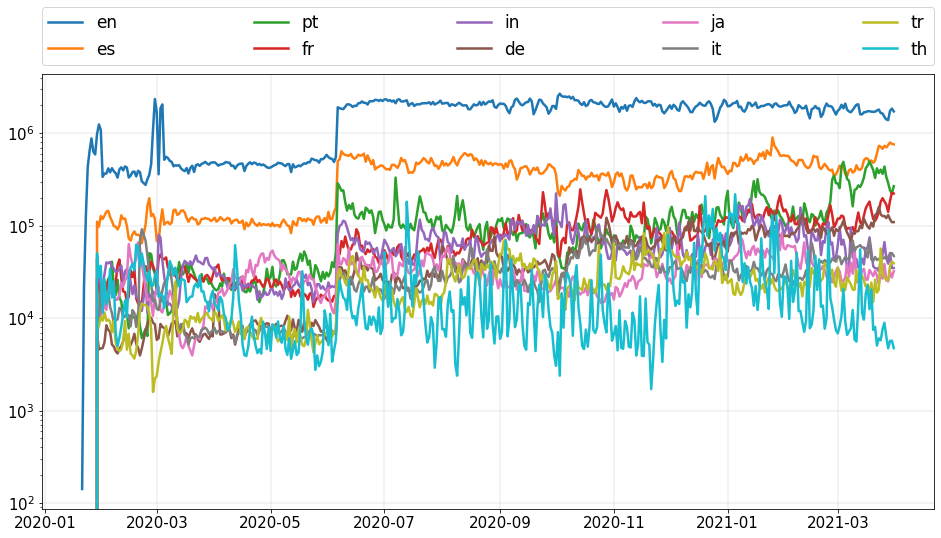

In [24]:
plt.figure(figsize=(16, 8))
for i, lang in enumerate(total_stats["index"]):
    plt.plot(daily_stats["date"], daily_stats[lang], label=lang)
plt.legend(
    bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
    loc="lower left",
    ncol=5,
    mode="expand",
    borderaxespad=0.0,
)
plt.grid(linewidth=0.3)
plt.gca().set_yscale("log")
plt.savefig(
    "thesis_img/tweets_per_language_over_time.svg", bbox_inches="tight", pad_inches=0
)
plt.show()

## Italian tweets

### Emotions per week

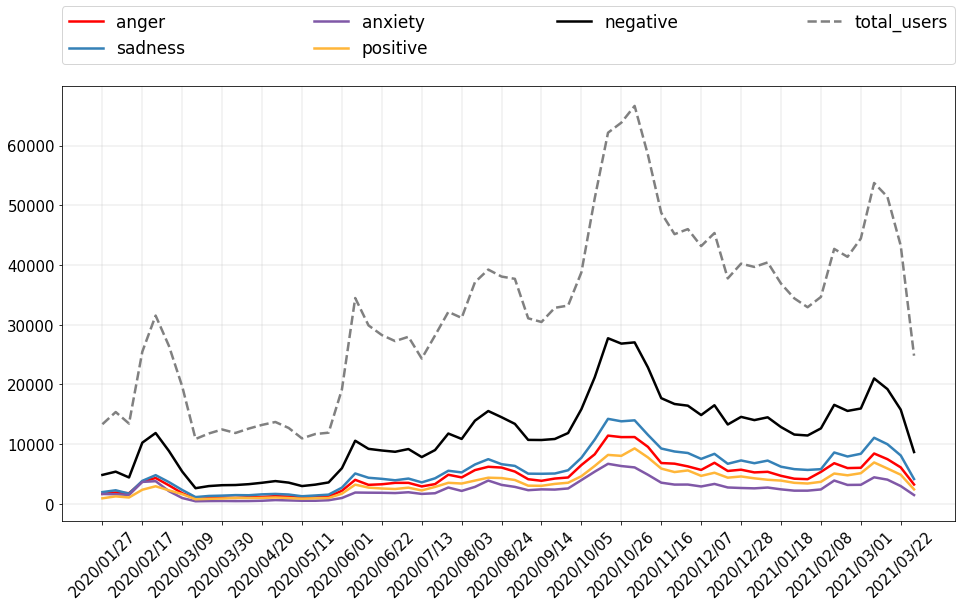

In [25]:
plot_absolute_value_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet.csv",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
)

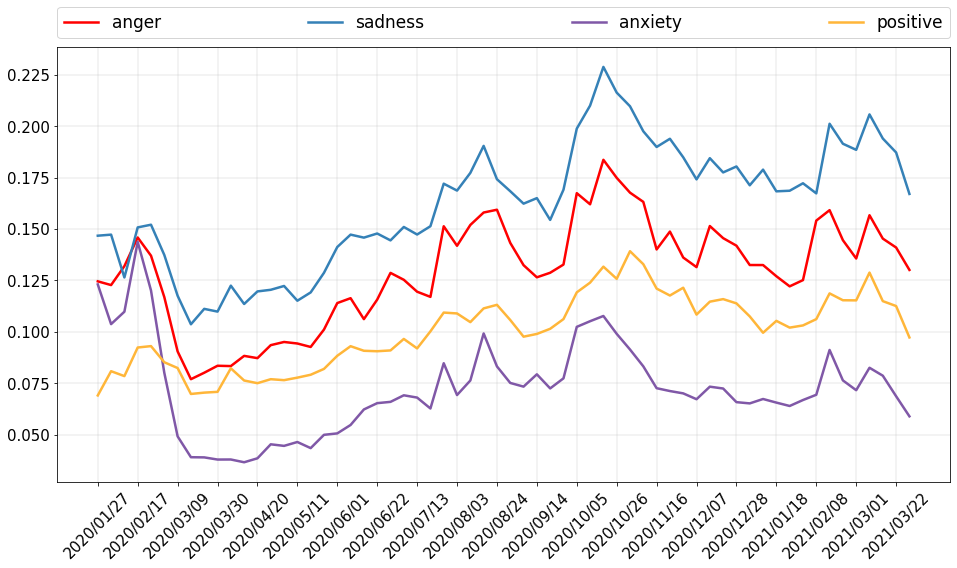

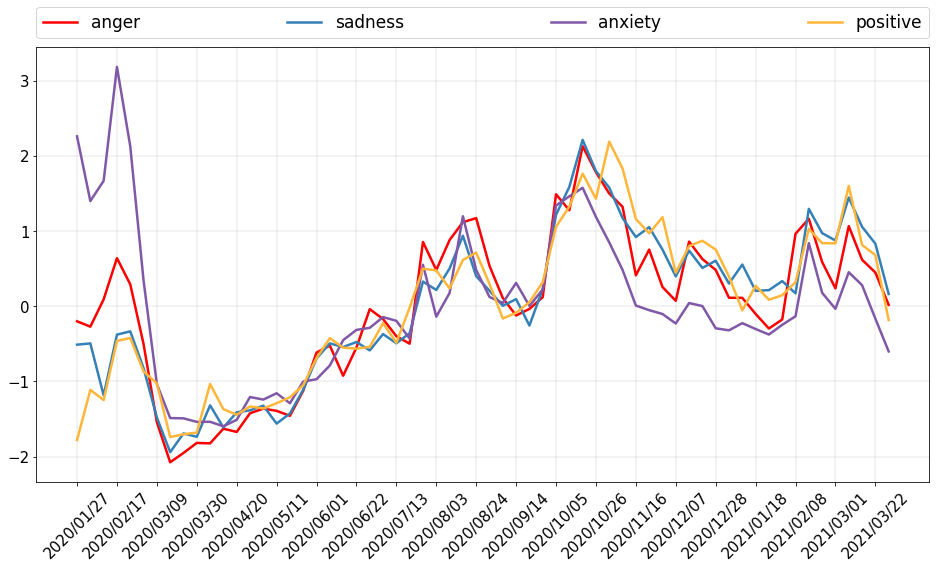

In [26]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/it-coronavirus-tweet-standardized.csv",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
    step=3,
)

#### Emotions per week subplots

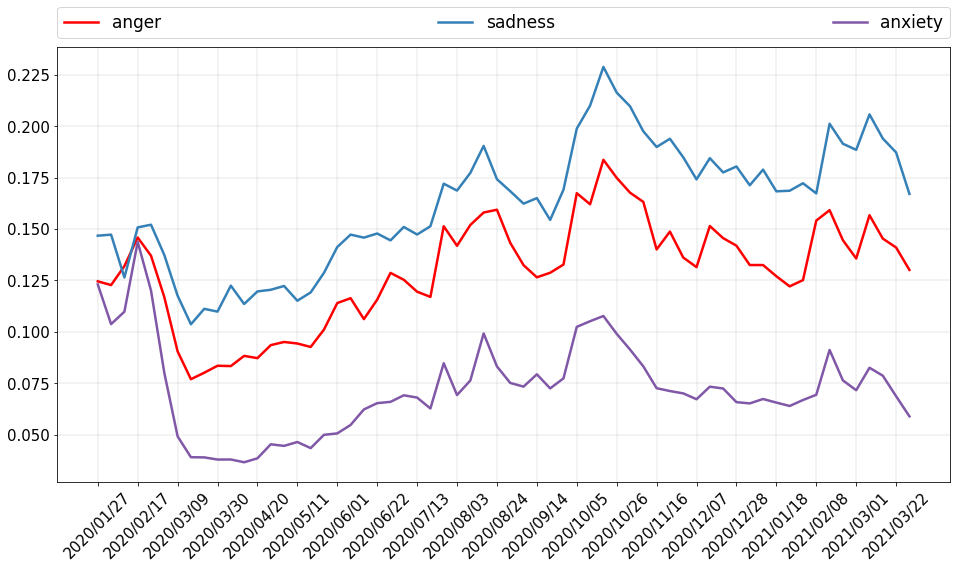

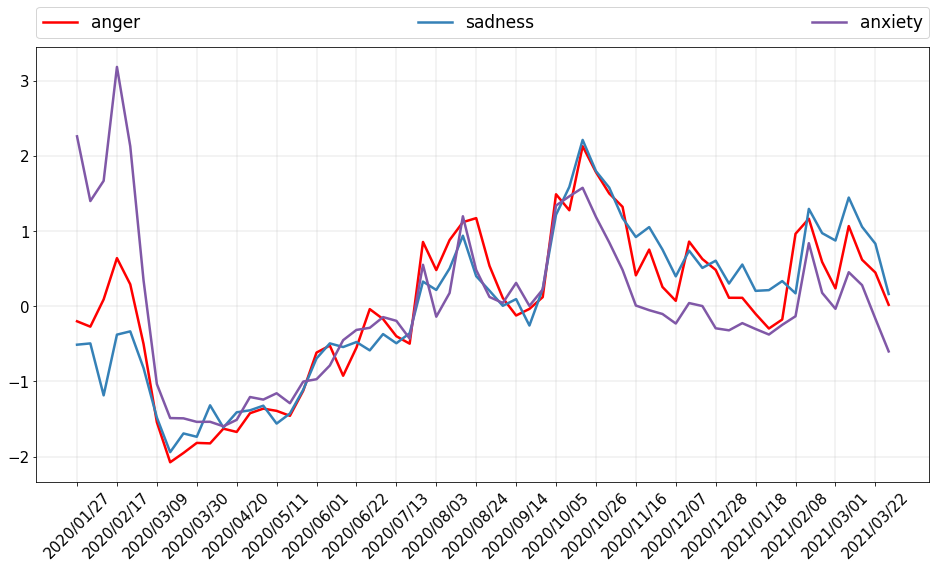

In [27]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/it-coronavirus-tweet-standardized.csv",
    categories=["Rabbia", "Tristez", "Ansia"],
)

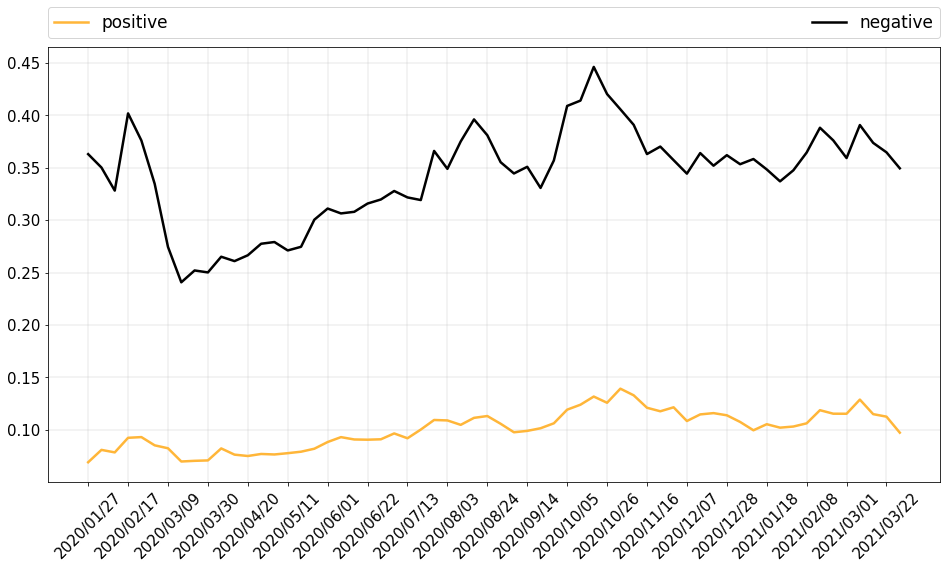

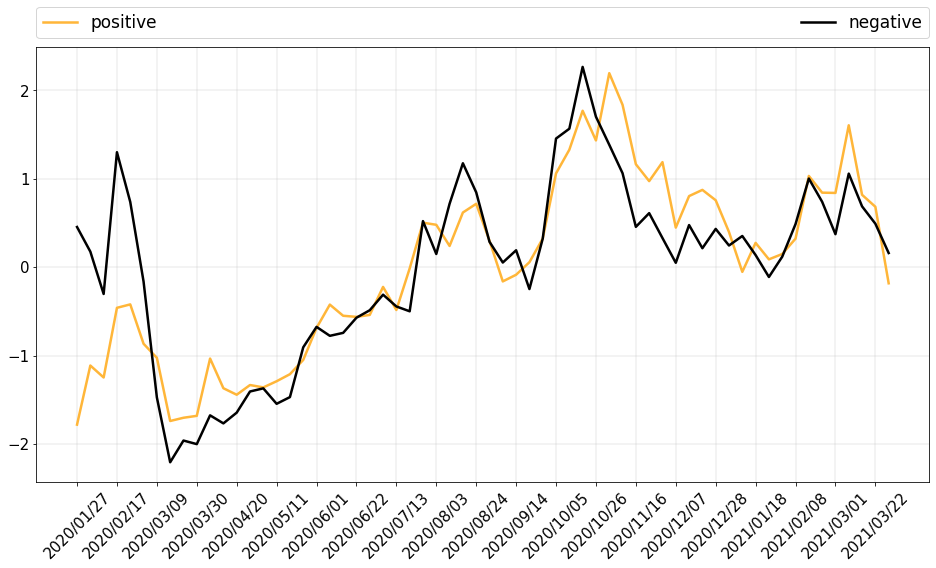

In [28]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/it-coronavirus-tweet-standardized.csv",
    categories=["Emo_Pos", "Emo_Neg"],
)

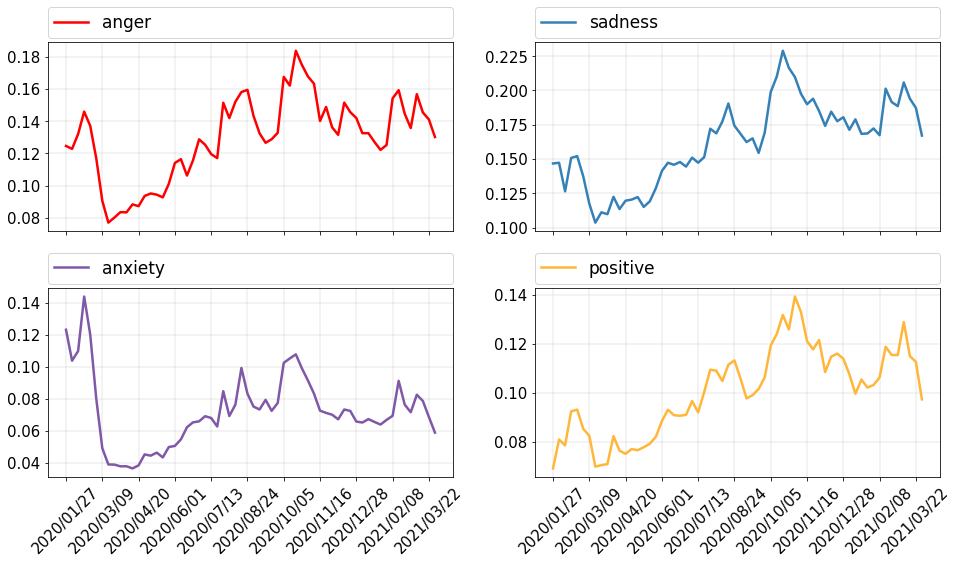

In [29]:
subplot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet.csv",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

#### Comparison between categories and emotions

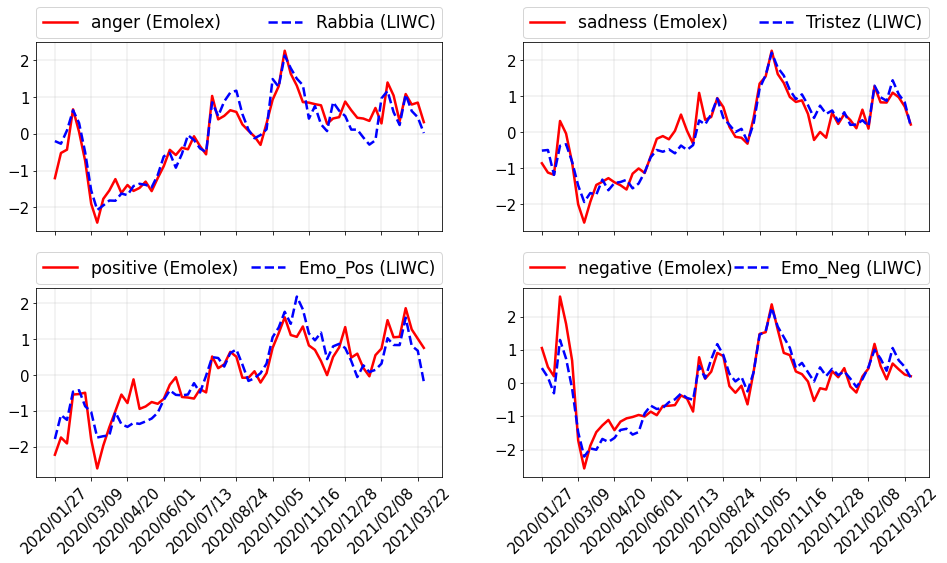

In [30]:
compare_emotion_and_liwc_categories(
    "hydrateTweet-crunch/results/standardize/it-coronavirus-tweet-standardized.csv",
    "hydrateTweet-crunch/output/liwc-standardize/it-coronavirus-tweet-standardized.csv",
    fig_size=(16, 8),
    emotions=["anger", "sadness", "positive", "negative"],
    categories=["Rabbia", "Tristez", "Emo_Pos", "Emo_Neg"],
    save="thesis_img/it_emotions_and_liwc_categories_comparison",
)

### Emotions per category per week

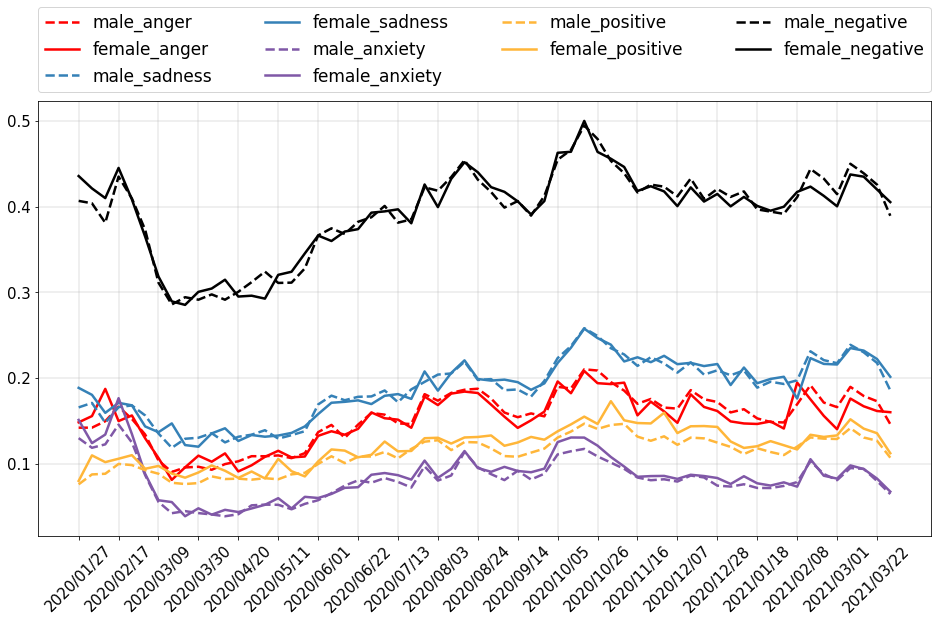

In [31]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-category.csv",
    kinds=["male", "female"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
)

#### Emotions per category per week subplots

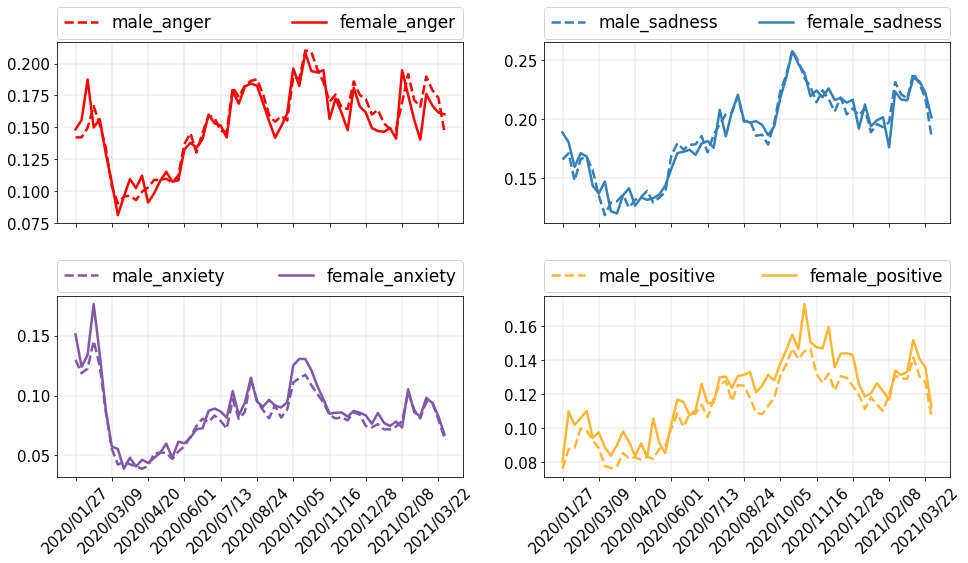

In [32]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-category.csv",
    cols=2,
    kinds=["male", "female"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

#### Emotions per category per week subplots (w.r.t. emotions expressed by all the users)

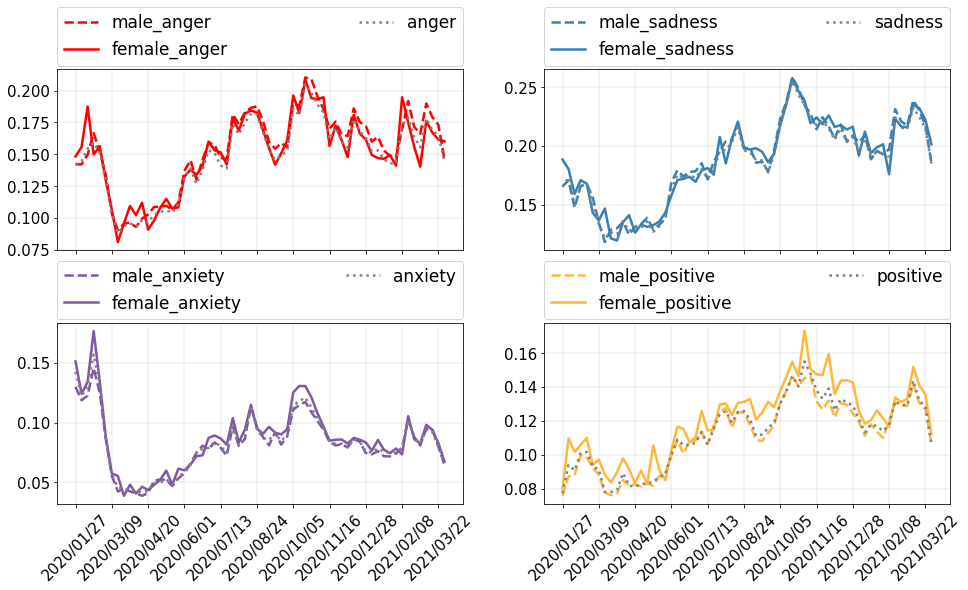

In [33]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=["male", "female"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

#### Z-score per category per week

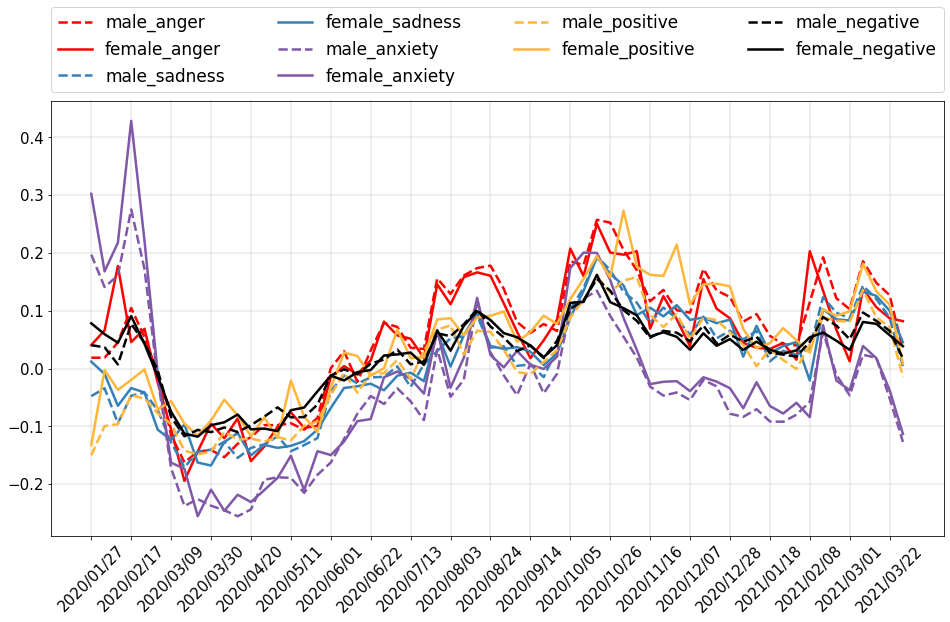

In [34]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/liwc-standardize/it-coronavirus-tweet-per-category-standardized.csv",
    kinds=["male", "female"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
)

### Emotions per tweet filtered by users number of tweets

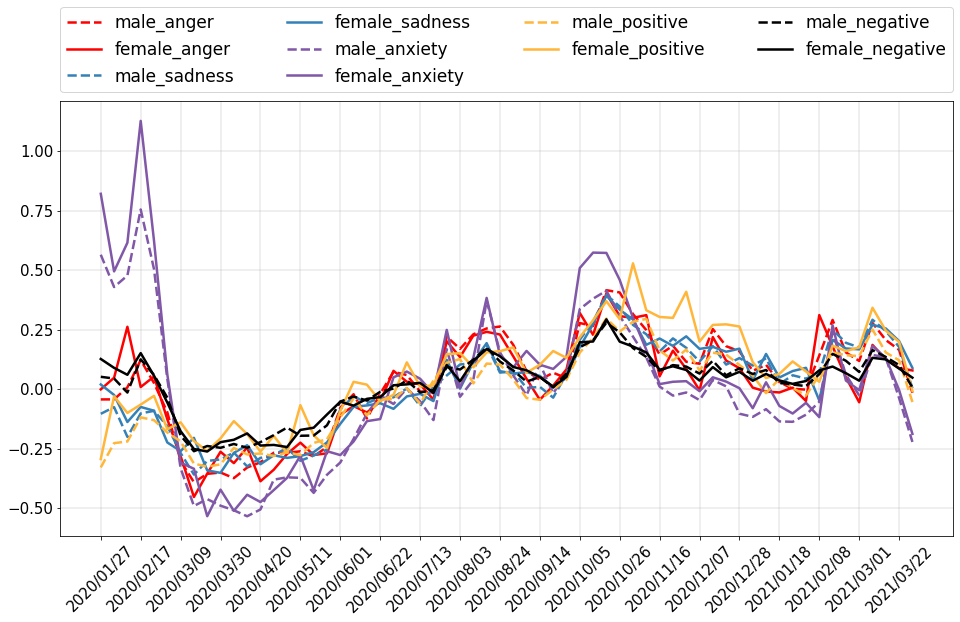

In [35]:
plot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-filtered.csv",
    kinds=["male", "female"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
)

#### Emotions per category per week w.r.t. mean emotion value

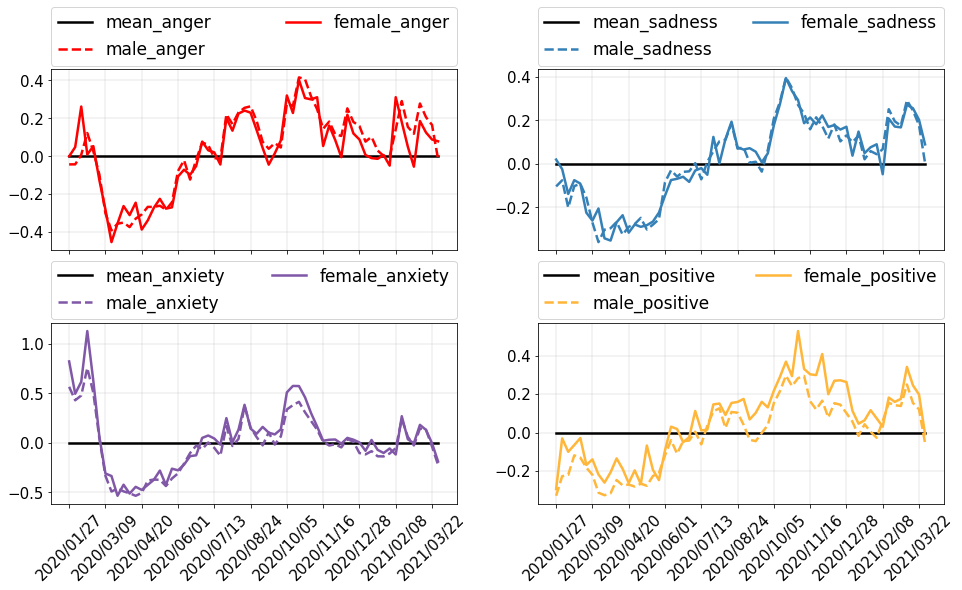

In [36]:
subplot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=["male", "female"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

### Emotions per age per week

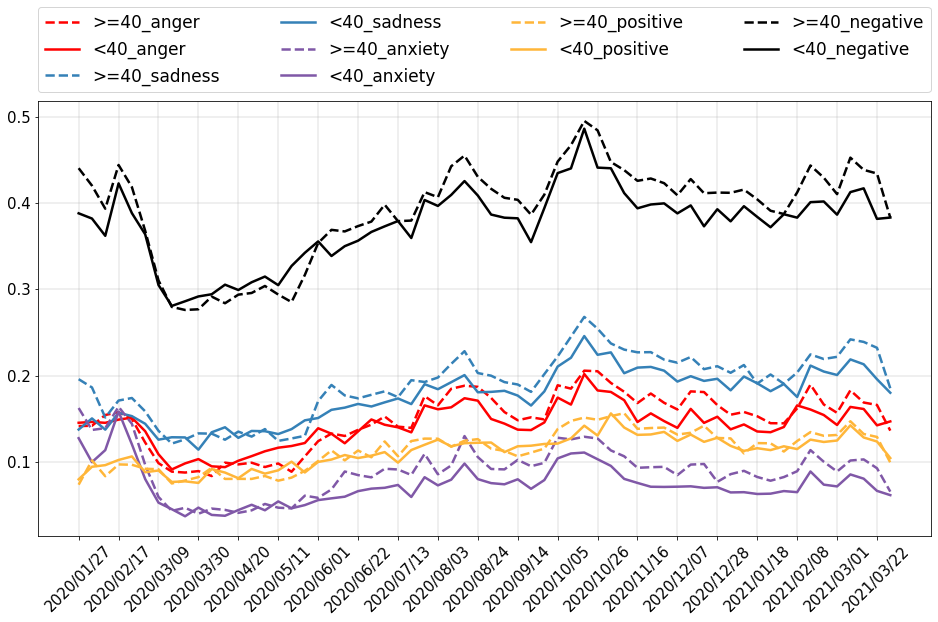

In [37]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-age.csv",
    kinds=[">=40", "<40"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
)

#### Emotions per age per week subplots

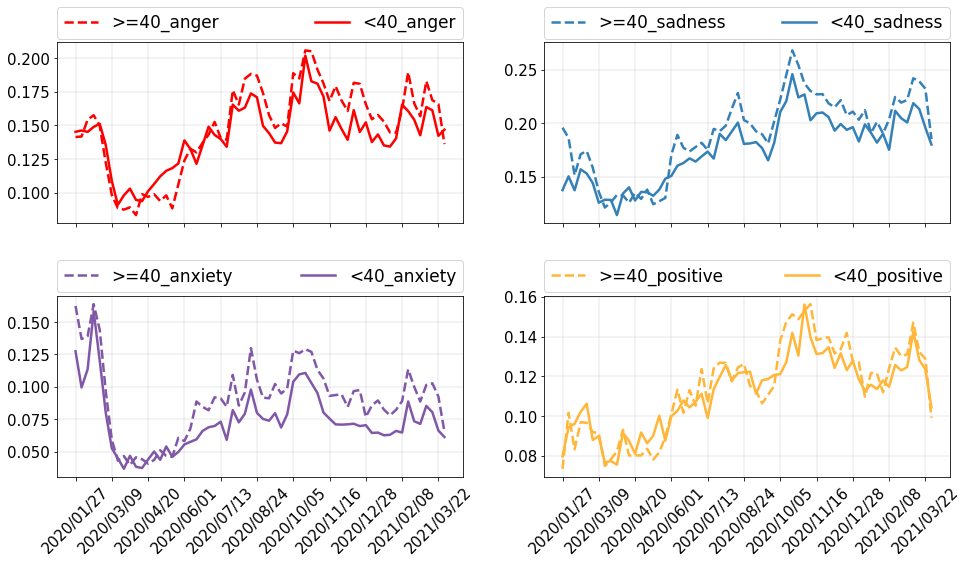

In [38]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-age.csv",
    cols=2,
    kinds=[">=40", "<40"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

#### Emotions per age per week subplots (w.r.t. emotions expressed by all the users)

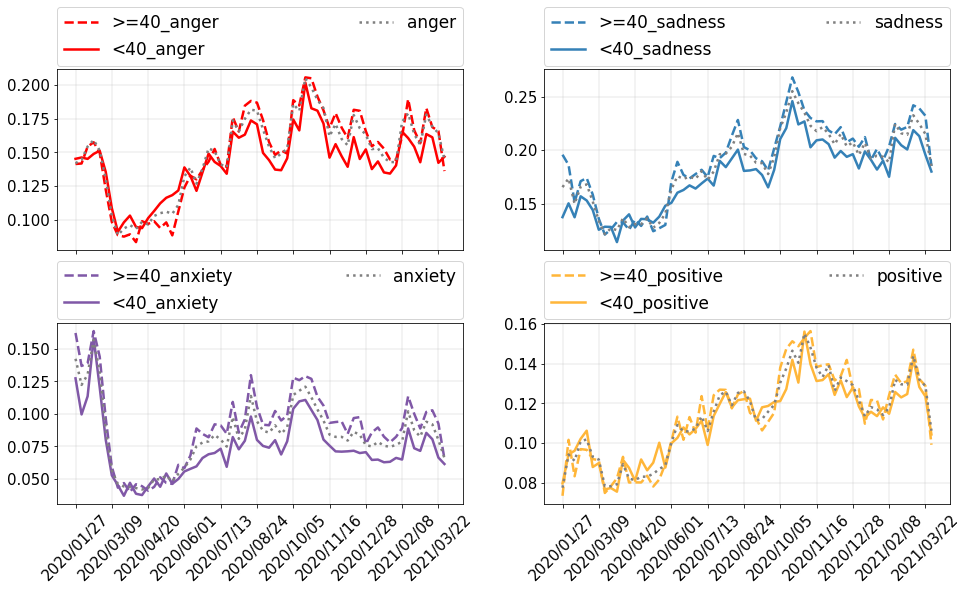

In [39]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=[">=40", "<40"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

#### Z-score per age per week

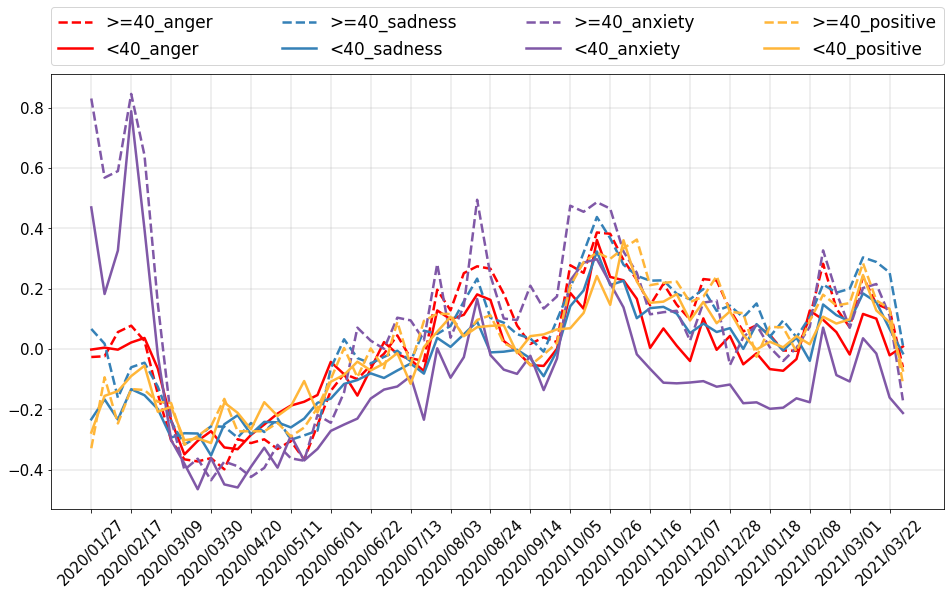

In [40]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/liwc-standardize/it-coronavirus-tweet-per-age-standardized.csv",
    kinds=[">=40", "<40"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

### Emotions per tweet filtered by users number of tweets

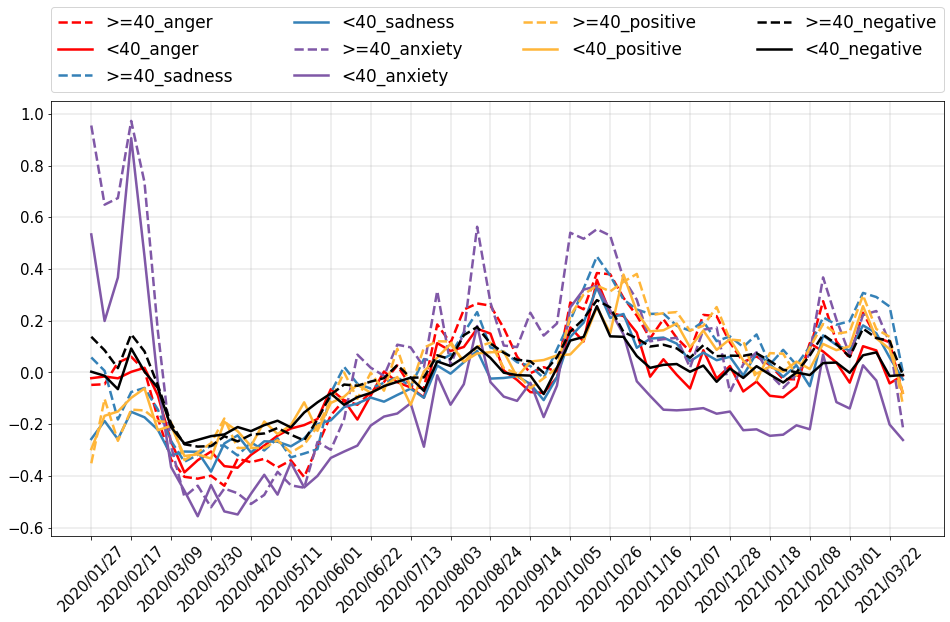

In [41]:
plot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-filtered.csv",
    kinds=[">=40", "<40"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
)

#### Emotions per age per week w.r.t. mean emotion value

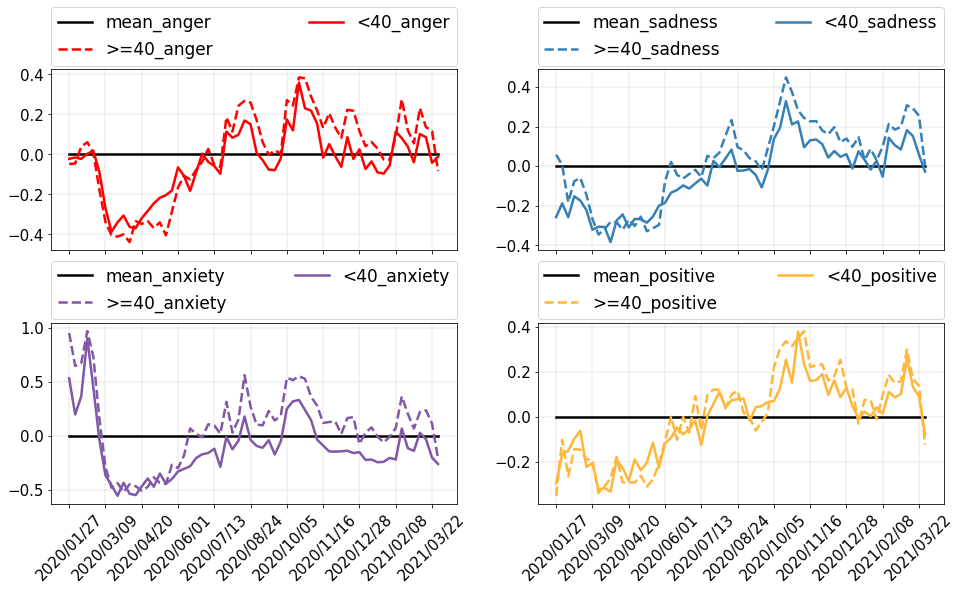

In [42]:
subplot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/it-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=[">=40", "<40"],
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos"],
)

    age     size  percentage
0   <40  1148157    0.668414
1  >=40   569576    0.331586


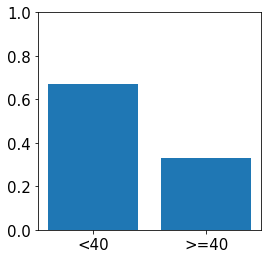

In [43]:
plot_user_percentage_per_age(
    "hydrateTweet-crunch/output/filter-inferred/per-age/en-inferred-users.csv",
    save="thesis_img/en_users_per_age",
)

### Spikes analysis

#### Week from 2020-02-17

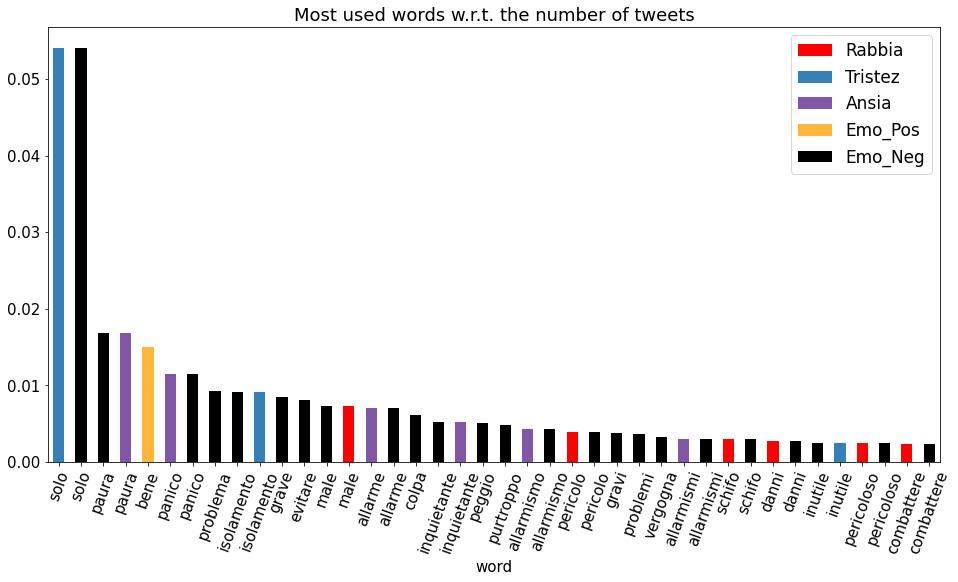

In [44]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-02-17-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    n_words=8,
)

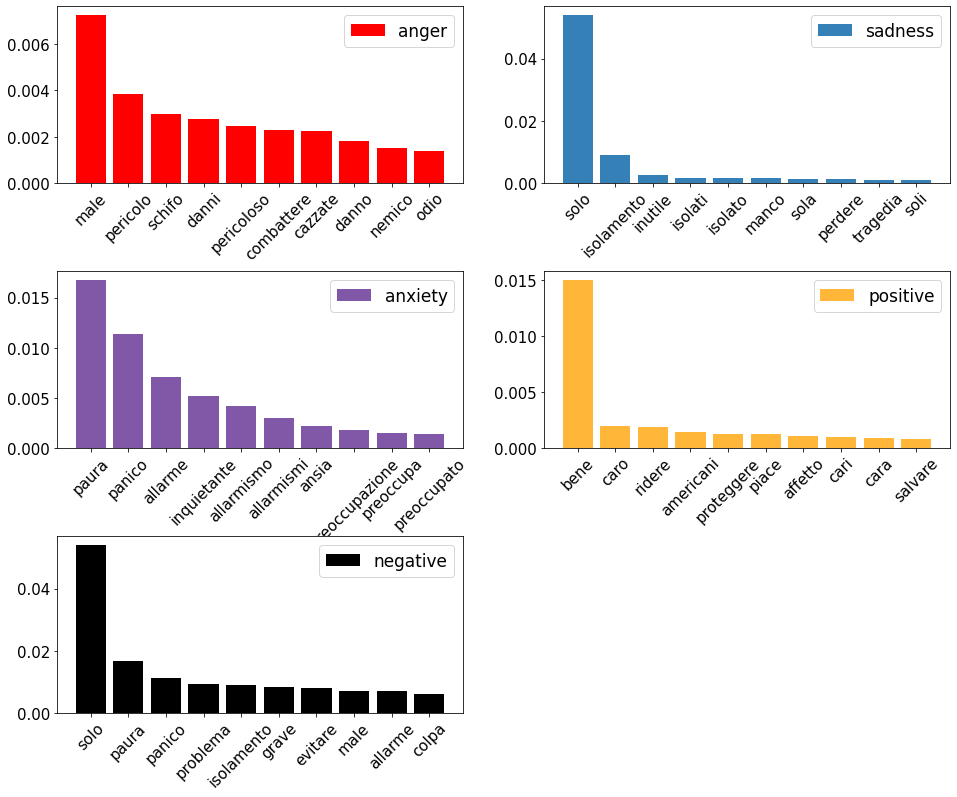

In [45]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-02-17-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    cols=2,
    fig_size=(16, 13),
    n_words=10,
)

#### Week from 2020-03-09

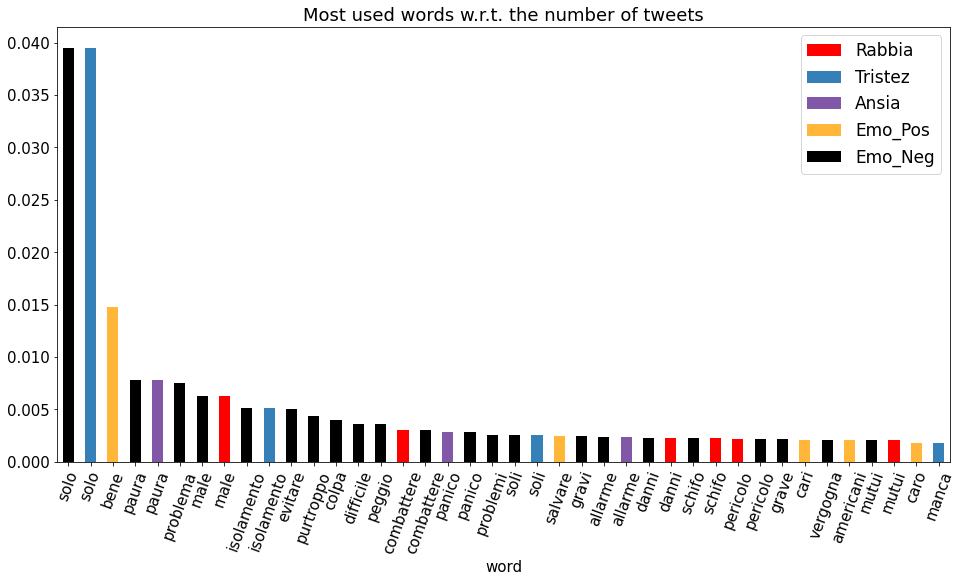

In [46]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-03-09-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    n_words=8,
)

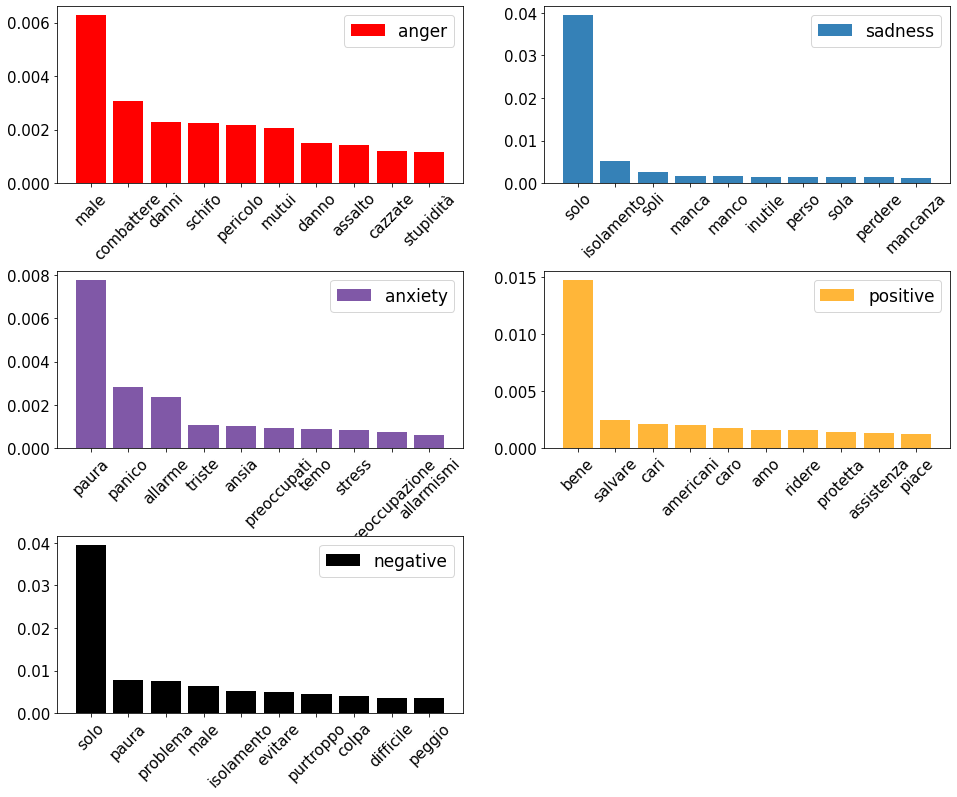

In [47]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-03-09-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    cols=2,
    fig_size=(16, 13),
    n_words=10,
)

#### Week from 2020-03-09

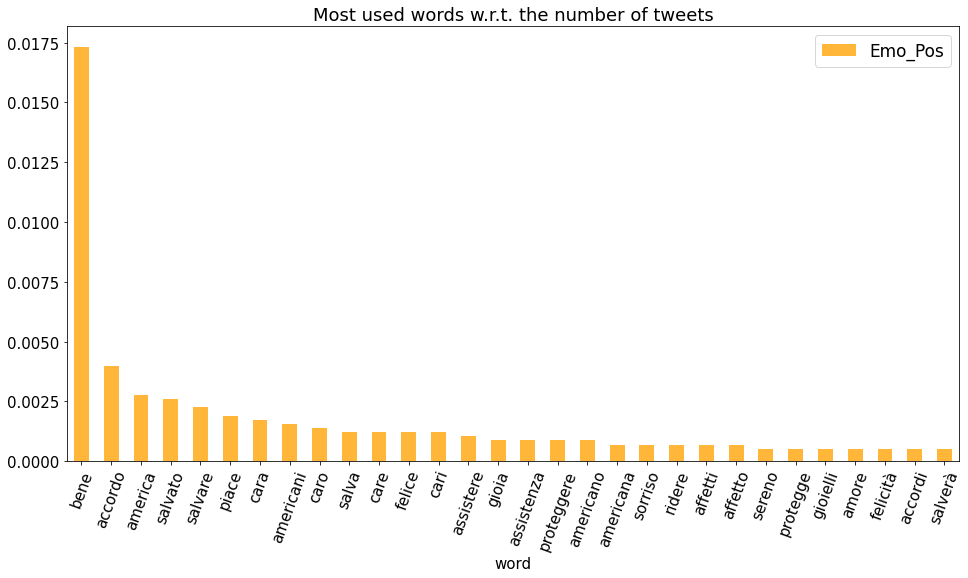

In [48]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/prova/liwc-words-frequency/it-coronavirus-tweet-2020-06-08-top-30-words.csv",
    categories=["Emo_Pos"],
    n_words=30,
)

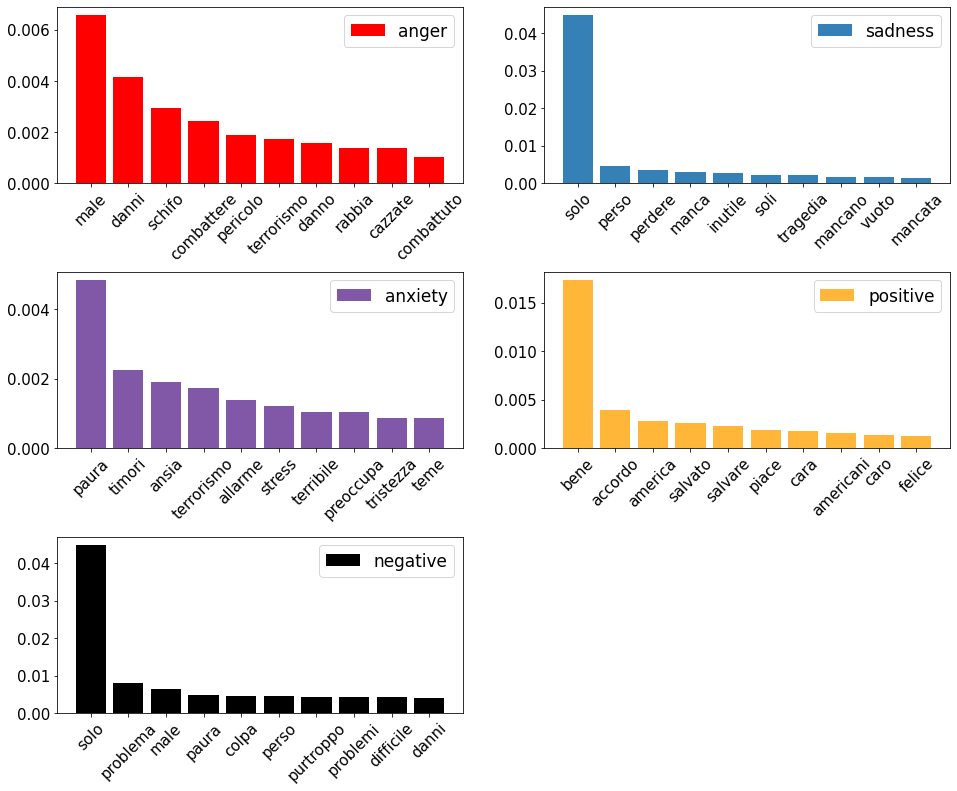

In [49]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/prova/liwc-words-frequency/it-coronavirus-tweet-2020-06-08-top-30-words.csv",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    cols=2,
    fig_size=(16, 13),
    n_words=10,
)

#### Week from 2020-10-19

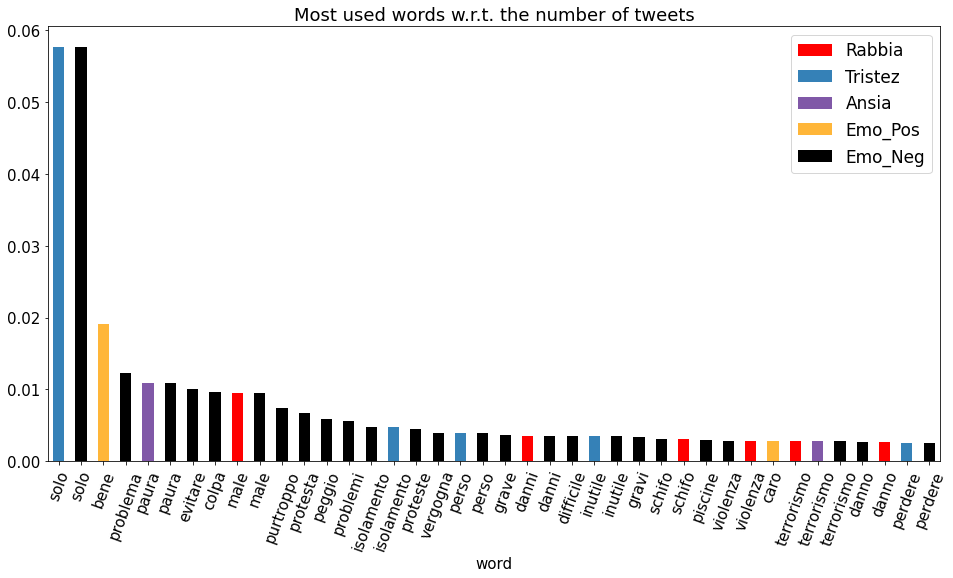

In [50]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-10-19-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    n_words=8,
)

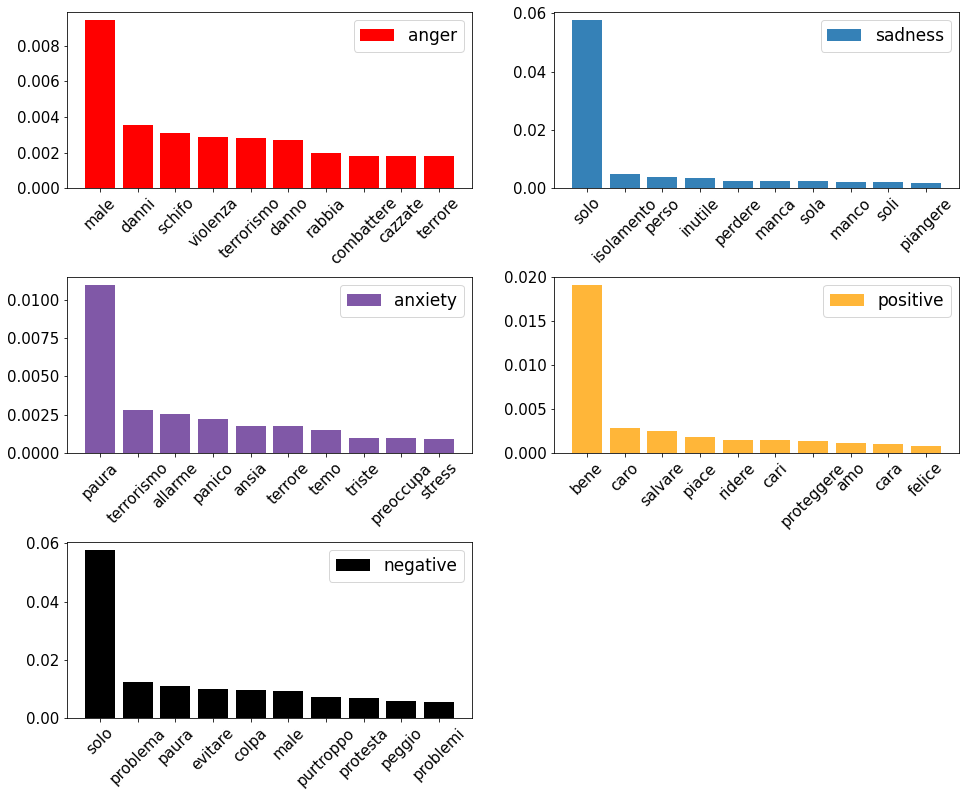

In [51]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-10-19-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    cols=2,
    fig_size=(16, 13),
    n_words=10,
)

### Users distribution

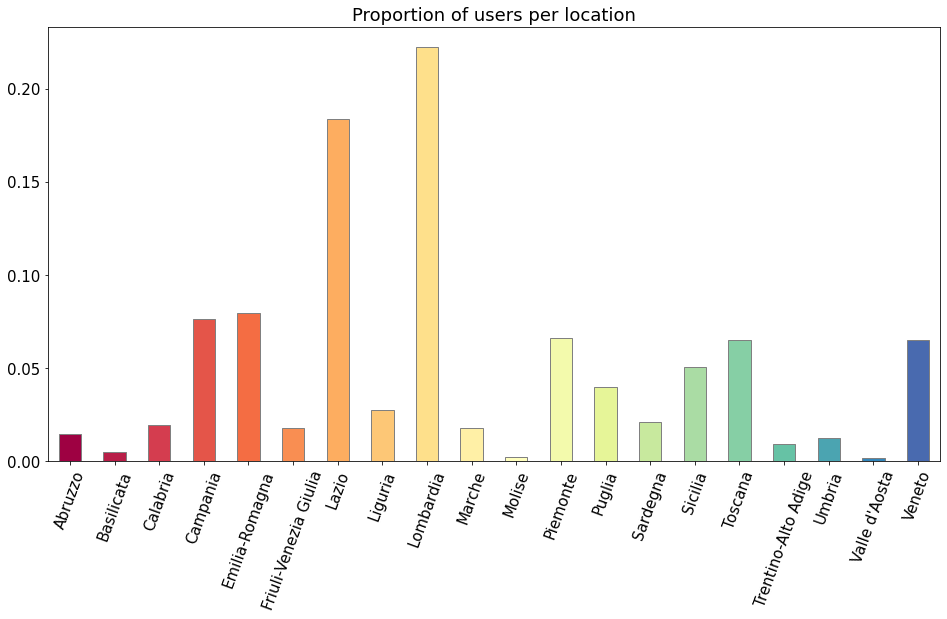

In [52]:
plot_users_distribution_per_location(
    "hydrateTweet-crunch/output/map-users-to-location/state/it-geocoded-users-per-state.json",
    save="thesis_img/it_users_per_state",
)

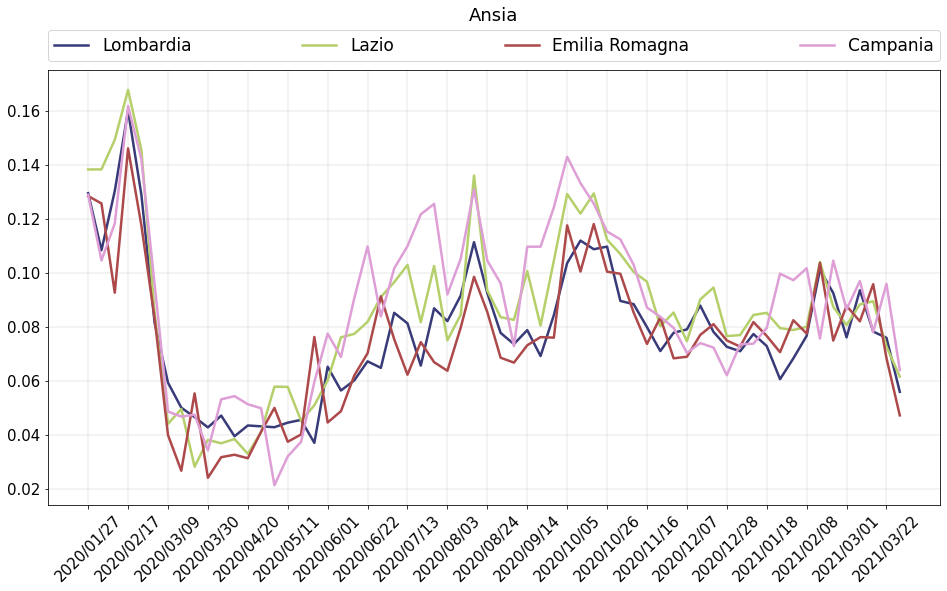

In [53]:
location_categories_files = [
    "hydrateTweet-crunch/output/analyse-locations-categories/state/it/it-coronavirus-tweet-Lombardia.csv",
    "hydrateTweet-crunch/output/analyse-locations-categories/state/it/it-coronavirus-tweet-Lazio.csv",
    "hydrateTweet-crunch/output/analyse-locations-categories/state/it/it-coronavirus-tweet-Emilia-Romagna.csv",
    "hydrateTweet-crunch/output/analyse-locations-categories/state/it/it-coronavirus-tweet-Campania.csv",
]
plot_category_per_location(
    location_categories_files, categories=["Ansia"], save="thesis_img/it_ansia_4_states"
)

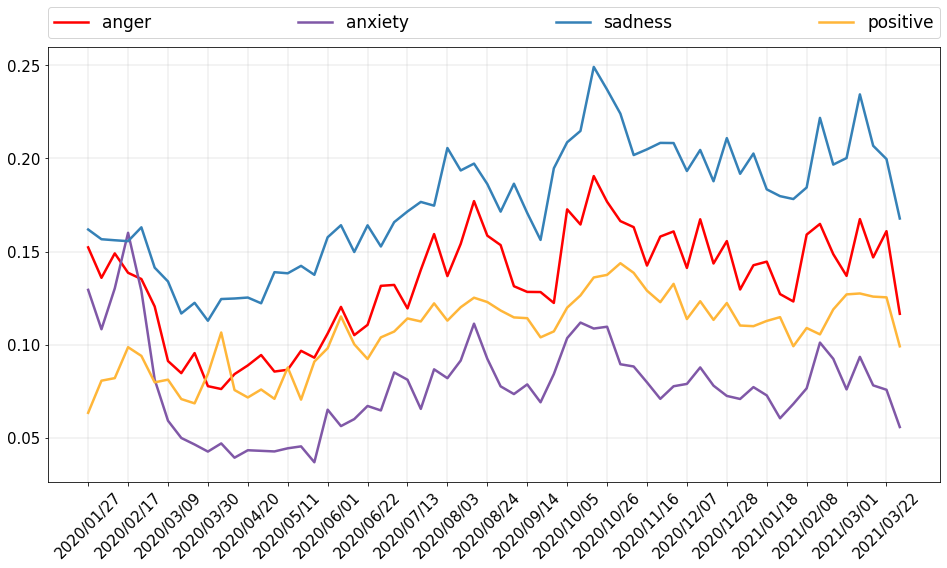

In [54]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-locations-categories/state/it/it-coronavirus-tweet-Lombardia.csv",
    categories=["Rabbia", "Ansia", "Tristez", "Emo_Pos"],
    save="thesis_img/it_4_categories_lombardia",
)

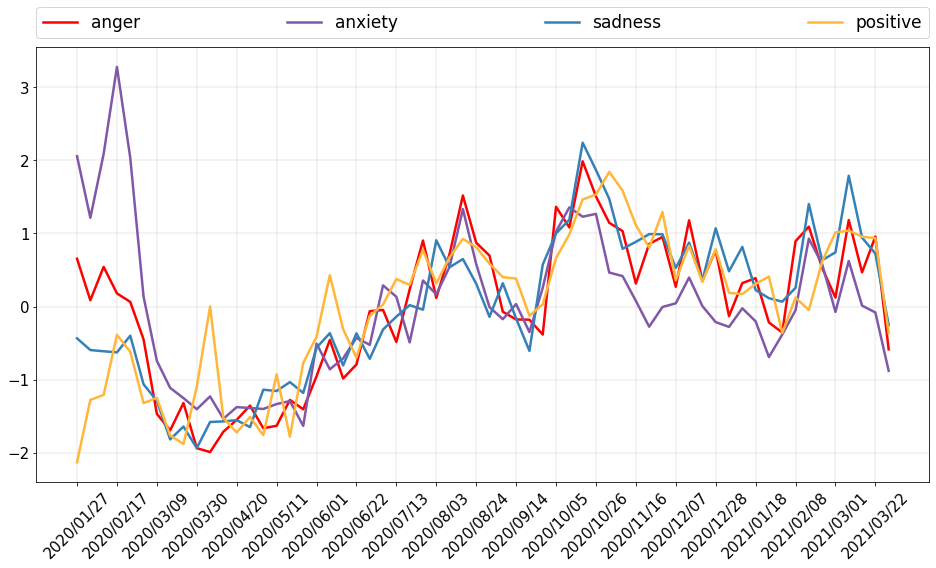

In [55]:
plot_liwc_categories_zscore(
    "hydrateTweet-crunch/output/analyse-locations-categories/state/it/it-coronavirus-tweet-Lombardia.csv",
    categories=["Rabbia", "Ansia", "Tristez", "Emo_Pos"],
    save="thesis_img/it_4_categories_lombardia_standardized",
)

## Spanish tweets

### Emotions per week

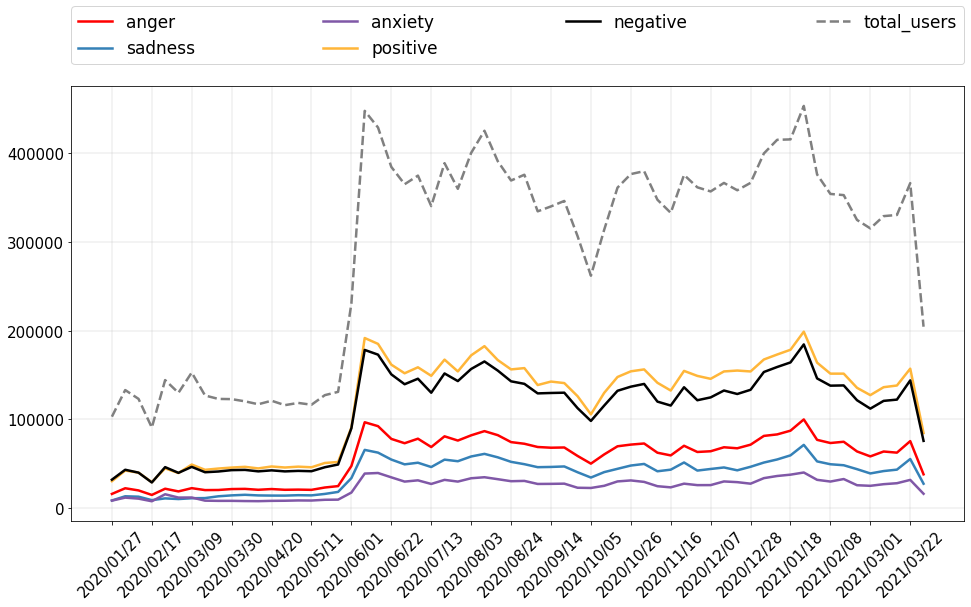

In [56]:
plot_absolute_value_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet.csv",
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos", "EmoNeg"],
)

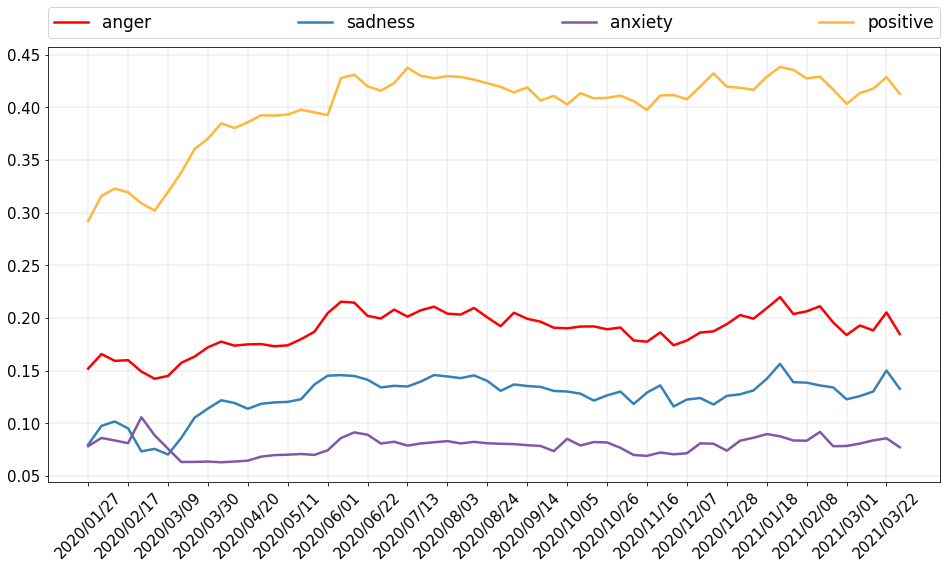

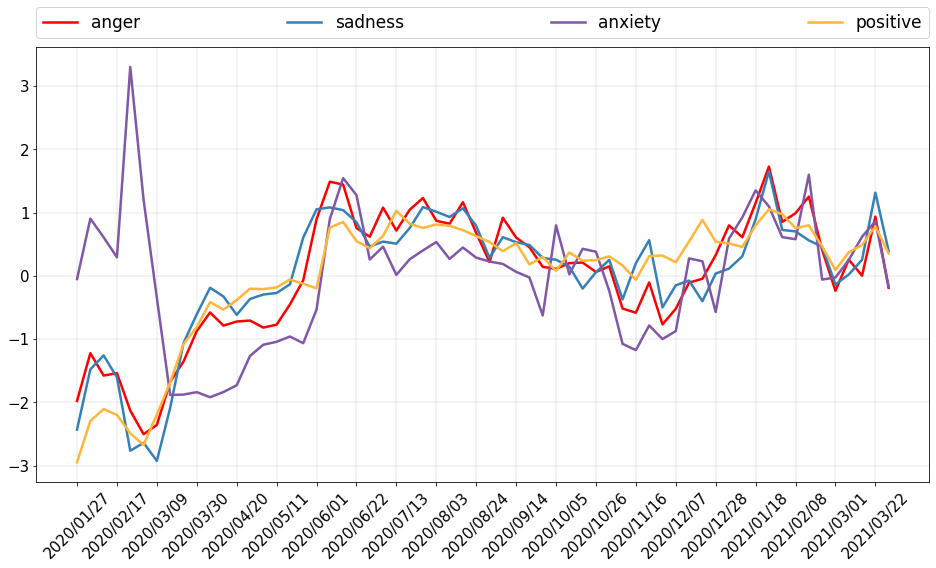

In [57]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/es-coronavirus-tweet-standardized.csv",
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

#### Emotions per week subplots

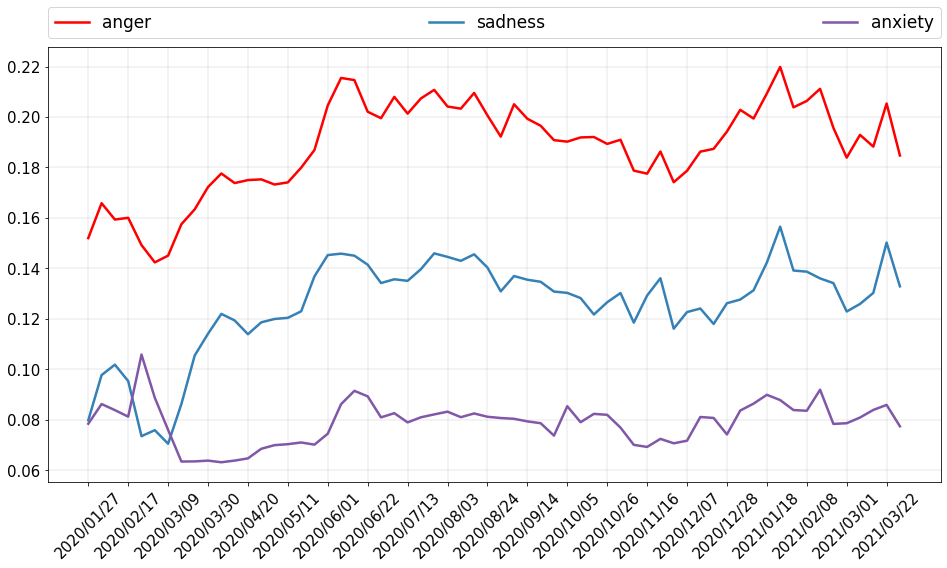

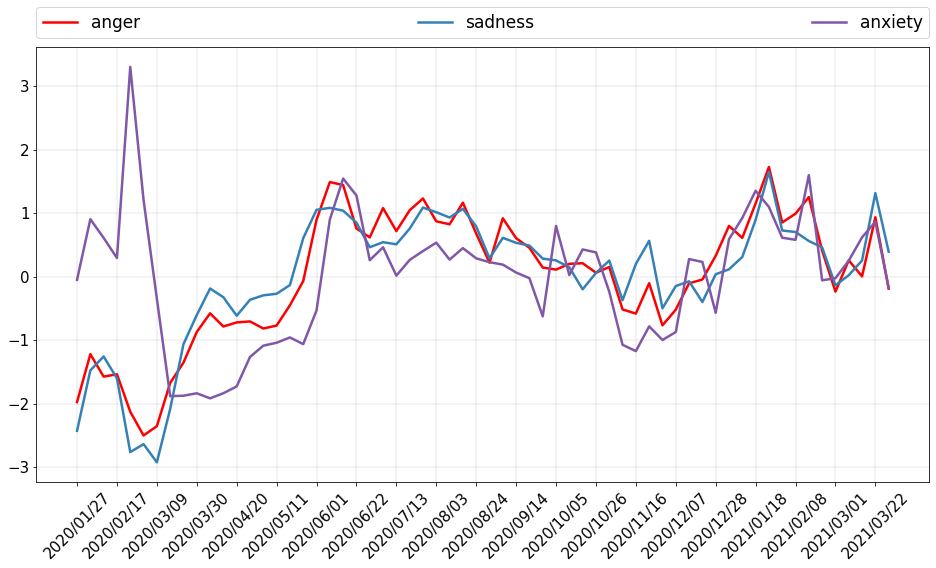

In [58]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/es-coronavirus-tweet-standardized.csv",
    categories=["Enfado", "Triste", "Ansiedad"],
)

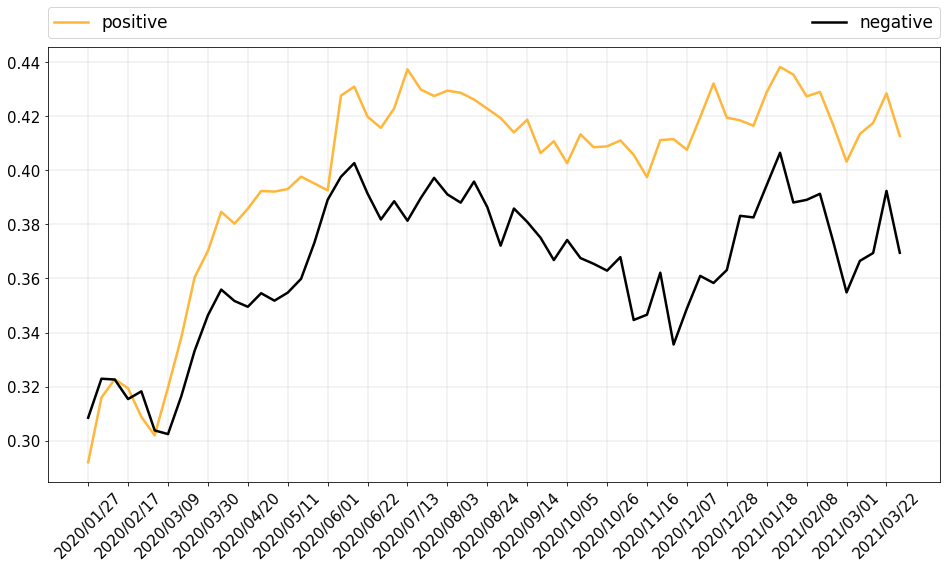

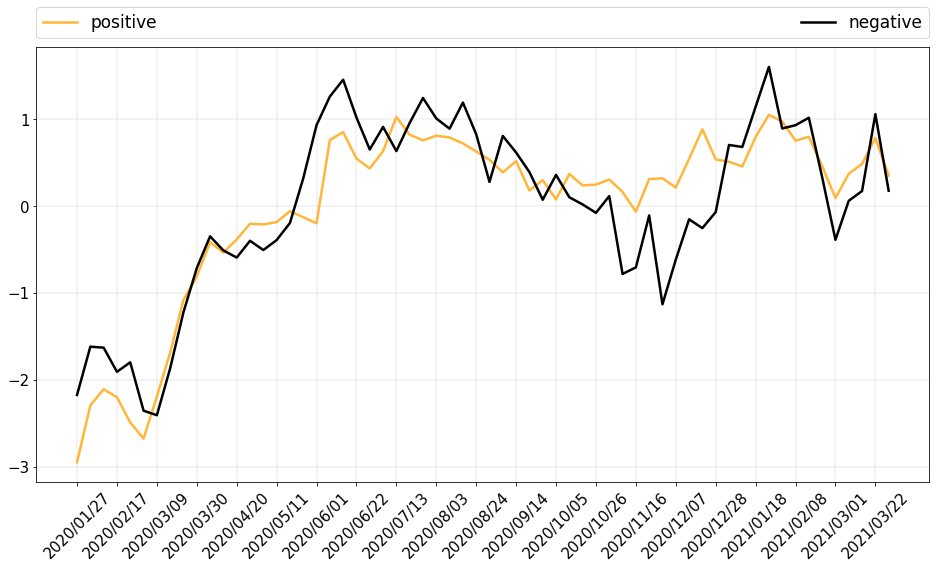

In [59]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/es-coronavirus-tweet-standardized.csv",
    categories=["EmoPos", "EmoNeg"],
)

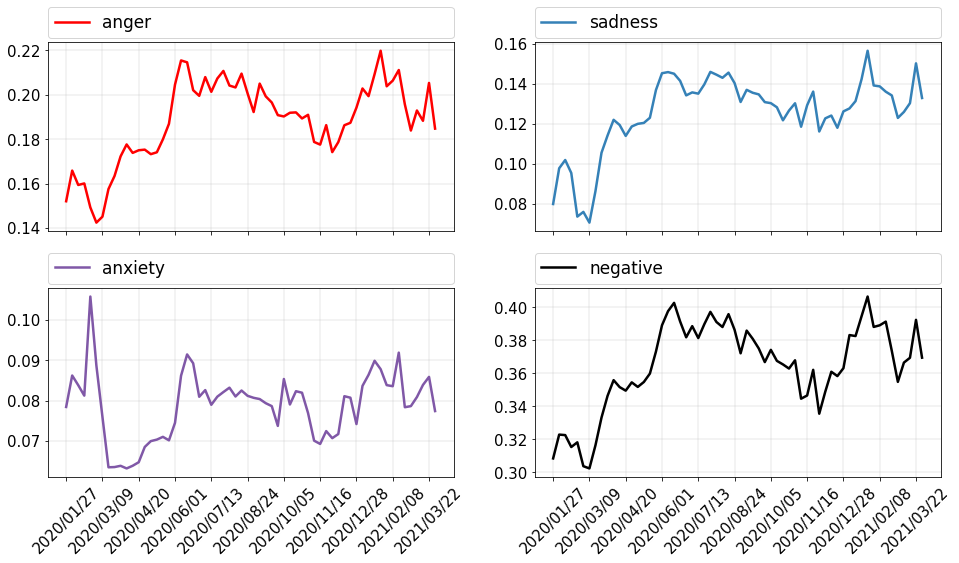

In [60]:
subplot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet.csv",
    categories=["Enfado", "Triste", "Ansiedad", "EmoNeg"],
)

#### Comparison between categories and emotions

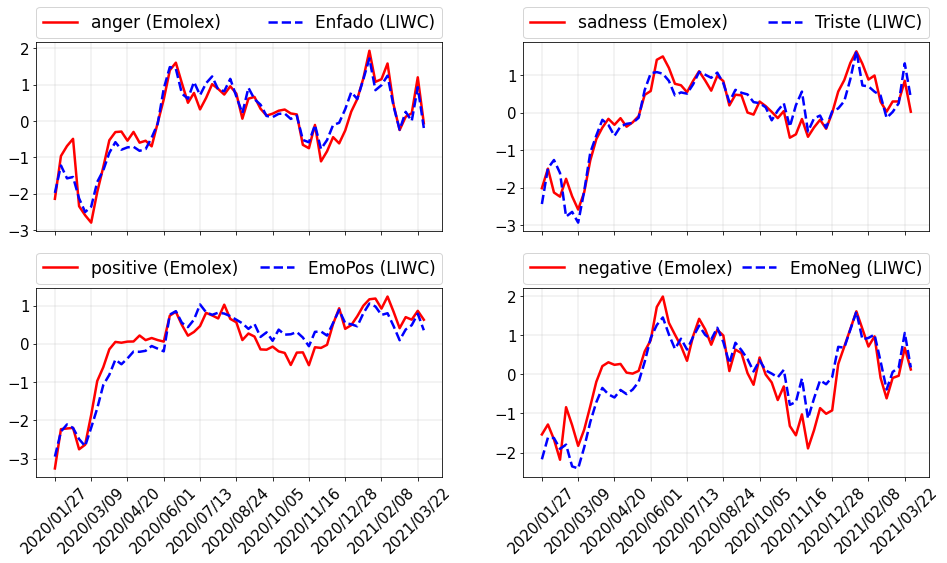

In [61]:
compare_emotion_and_liwc_categories(
    "hydrateTweet-crunch/results/standardize/es-coronavirus-tweet-standardized.csv",
    "hydrateTweet-crunch/output/liwc-standardize/es-coronavirus-tweet-standardized.csv",
    fig_size=(16, 8),
    emotions=["anger", "sadness", "positive", "negative"],
    categories=["Enfado", "Triste", "EmoPos", "EmoNeg"],
    save="thesis_img/es_emotions_and_liwc_categories_comparison",
)

### Emotions per category per week

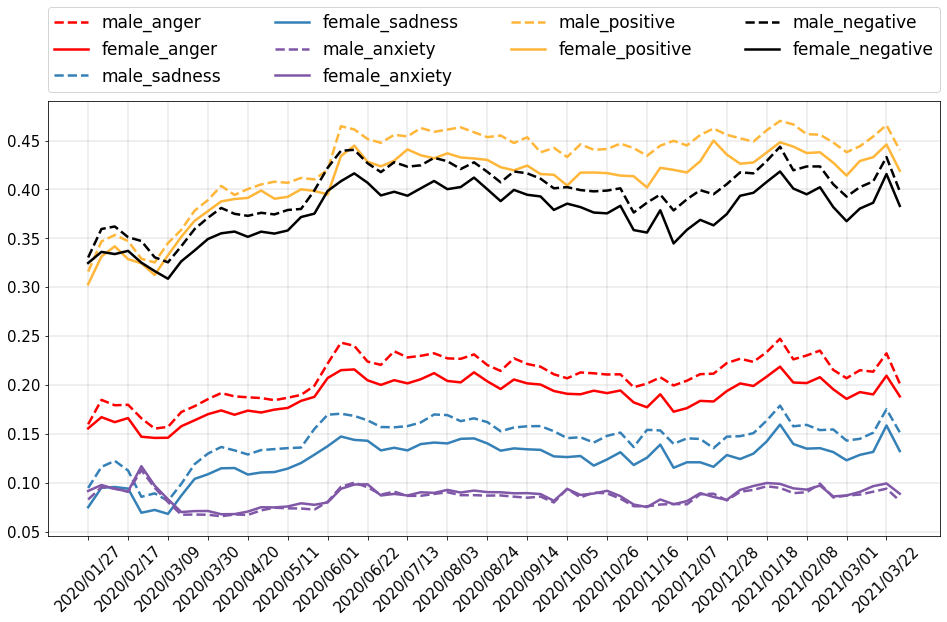

In [62]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-category.csv",
    kinds=["male", "female"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos", "EmoNeg"],
)

#### Emotions per category per week subplots

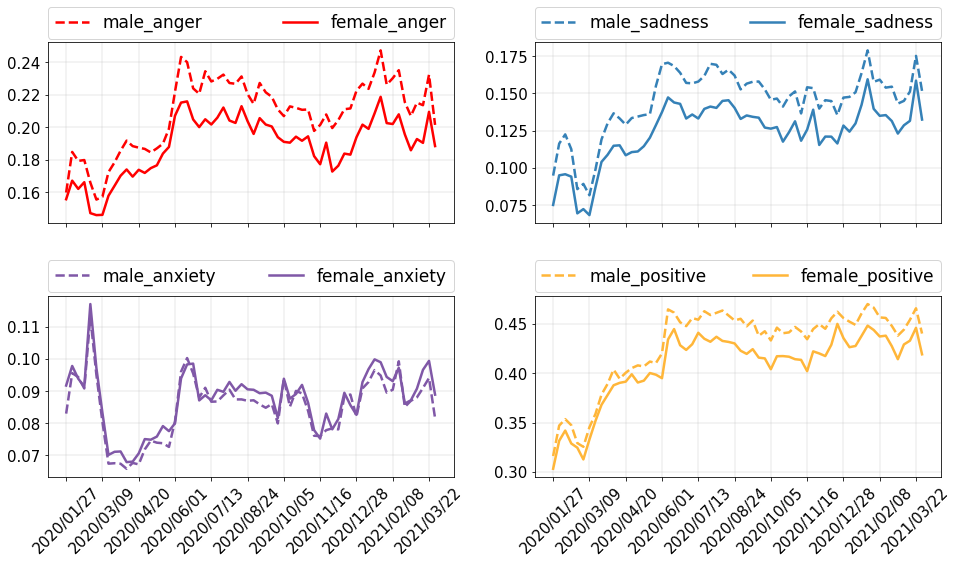

In [63]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-category.csv",
    cols=2,
    kinds=["male", "female"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

#### Emotions per category per week subplots (w.r.t. emotions expressed by all the users)

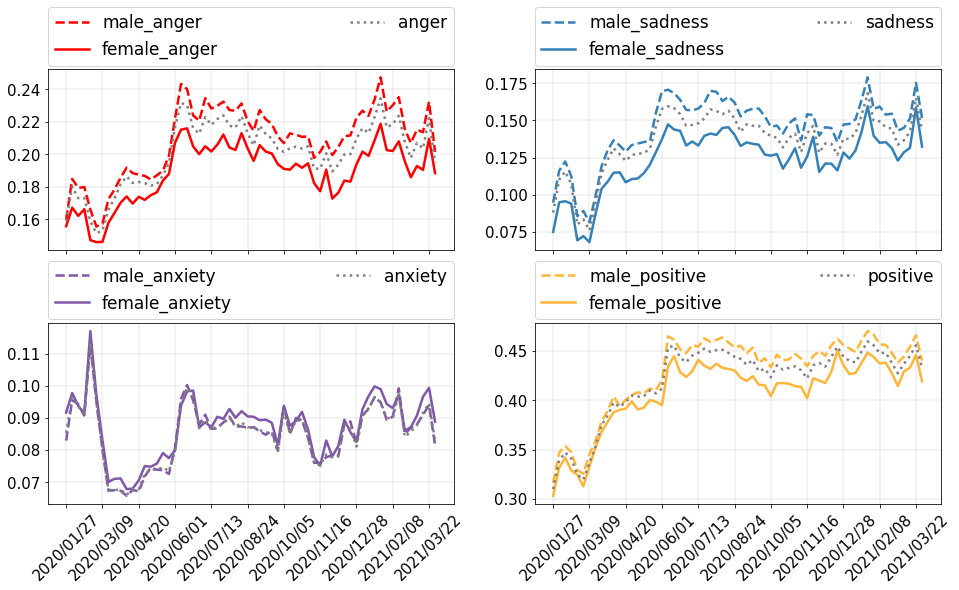

In [64]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=["male", "female"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

#### Z-score per category per week

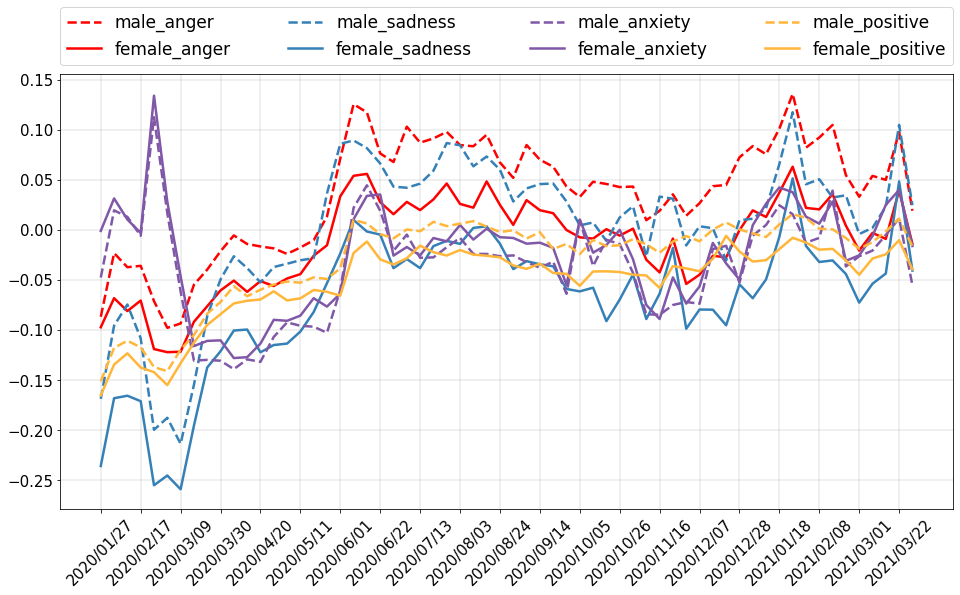

In [65]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/liwc-standardize/es-coronavirus-tweet-per-category-standardized.csv",
    kinds=["male", "female"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

### Emotions per tweet filtered by users number of tweets

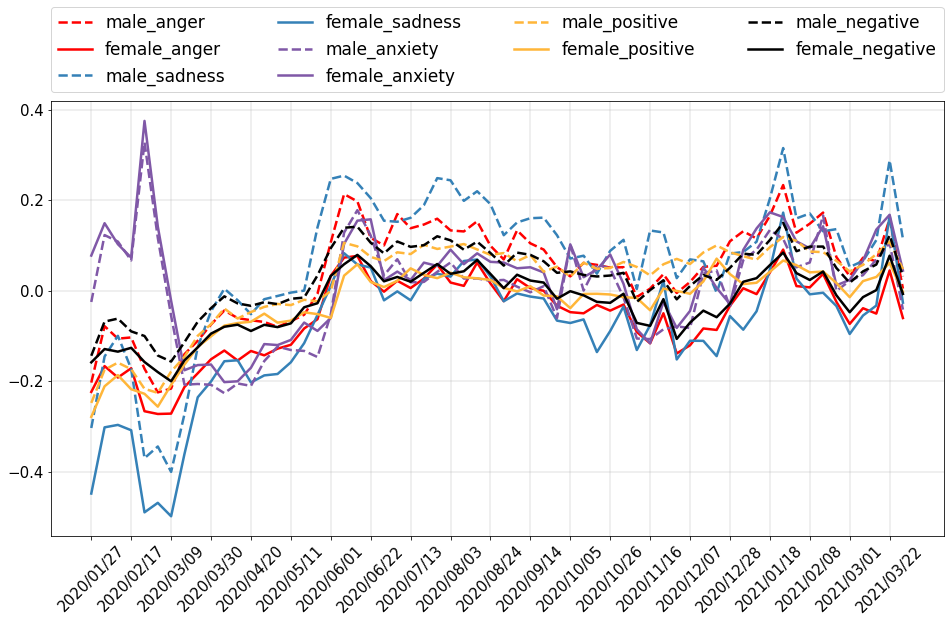

In [66]:
plot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-filtered.csv",
    kinds=["male", "female"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos", "EmoNeg"],
)

#### Emotions per category per week w.r.t. mean emotion value

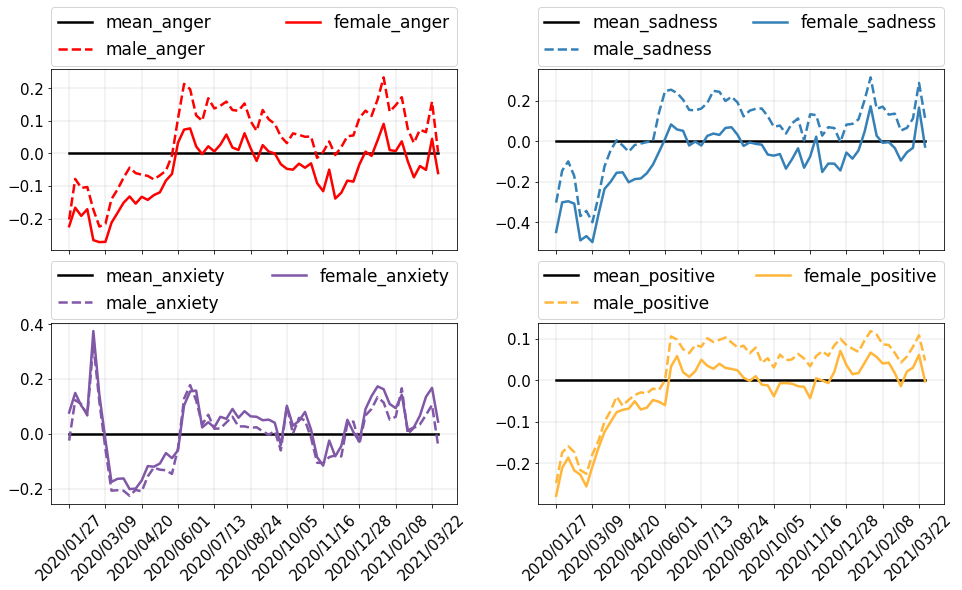

In [67]:
subplot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=["male", "female"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

### Emotions per age per week

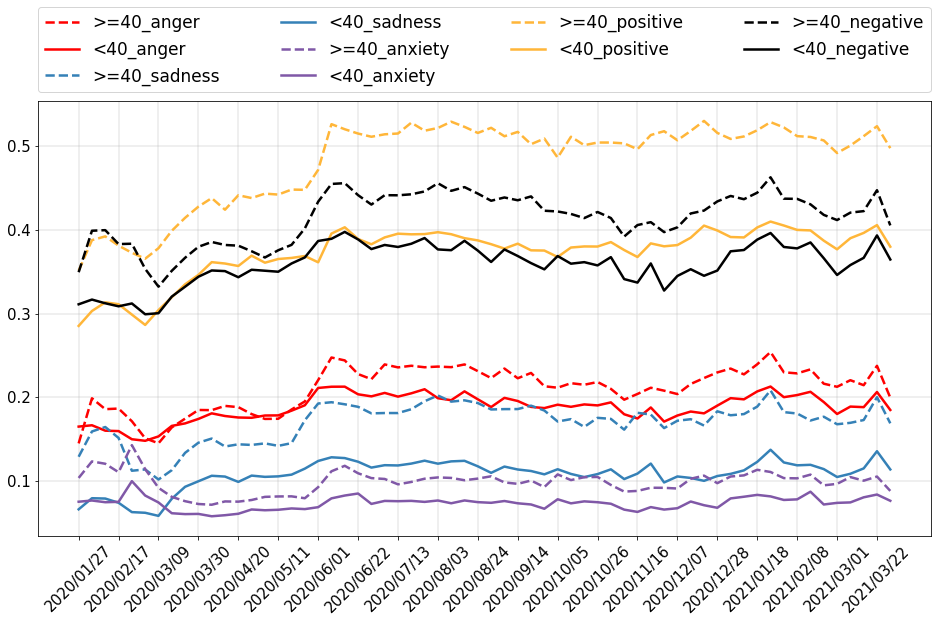

In [68]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-age.csv",
    kinds=[">=40", "<40"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos", "EmoNeg"],
)

#### Emotions per age per week subplots

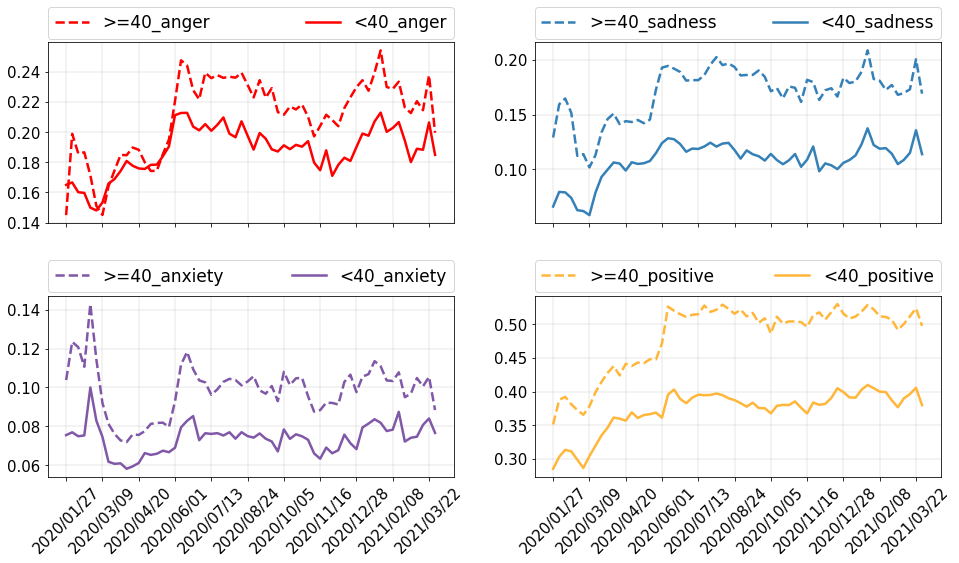

In [69]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-age.csv",
    cols=2,
    kinds=[">=40", "<40"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

#### Emotions per age per week subplots (w.r.t. emotions expressed by all the users)

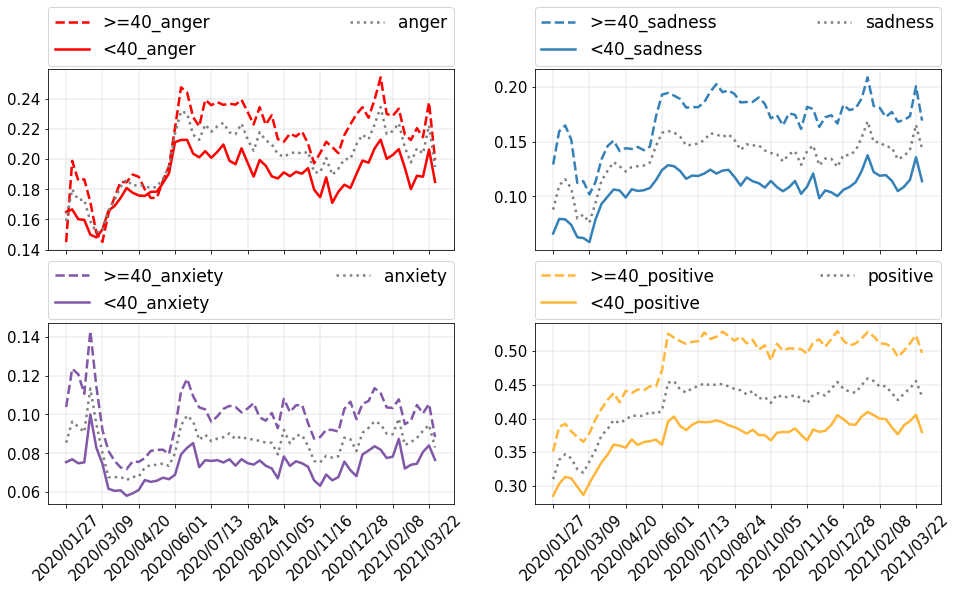

In [70]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=[">=40", "<40"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

#### Z-score per age per week

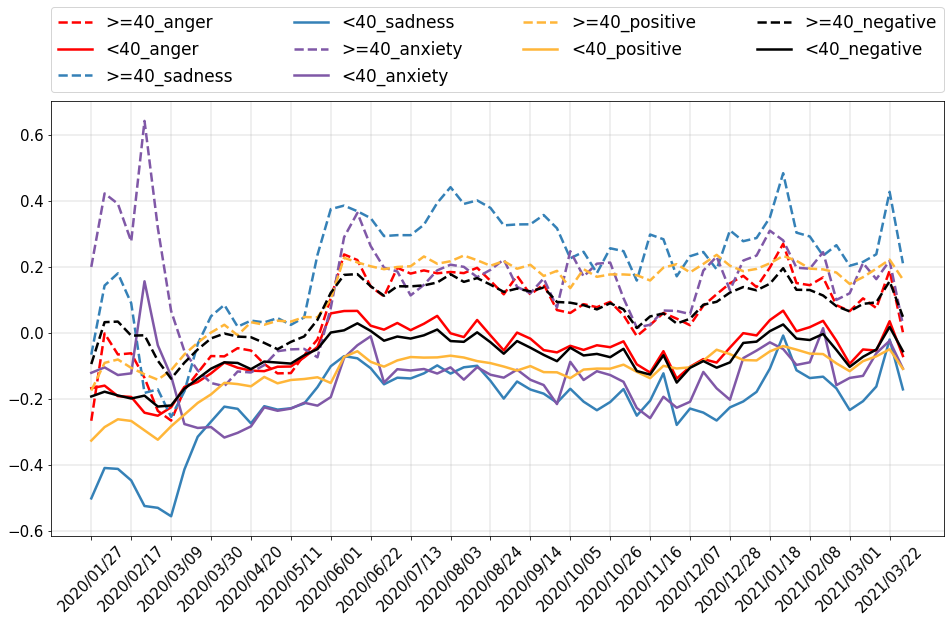

In [71]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/liwc-standardize/es-coronavirus-tweet-per-age-standardized.csv",
    kinds=[">=40", "<40"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos", "EmoNeg"],
)

### Emotions per tweet filtered by users number of tweets

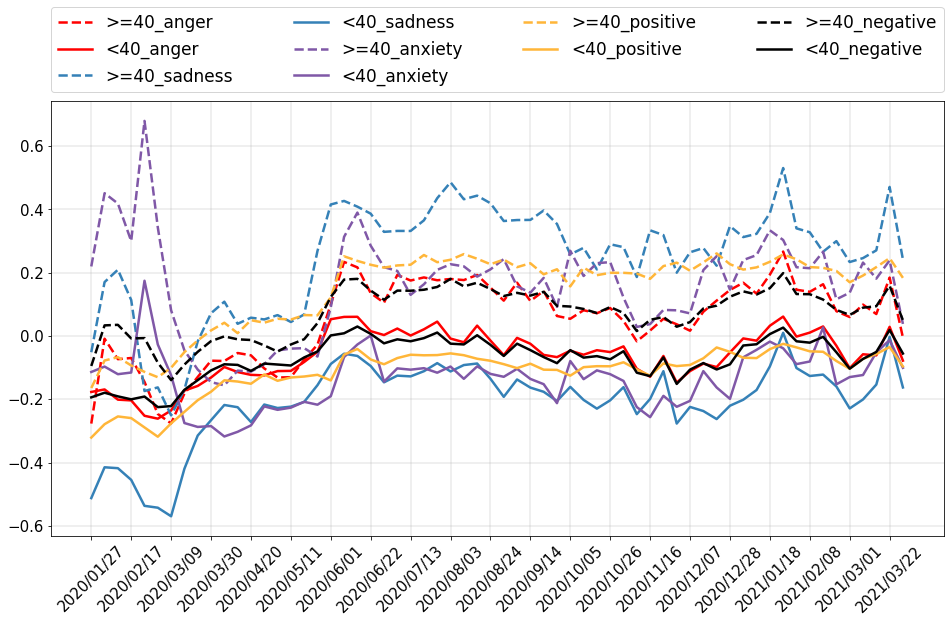

In [72]:
plot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-filtered.csv",
    kinds=[">=40", "<40"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos", "EmoNeg"],
)

#### Emotions per age per week w.r.t. mean emotion value

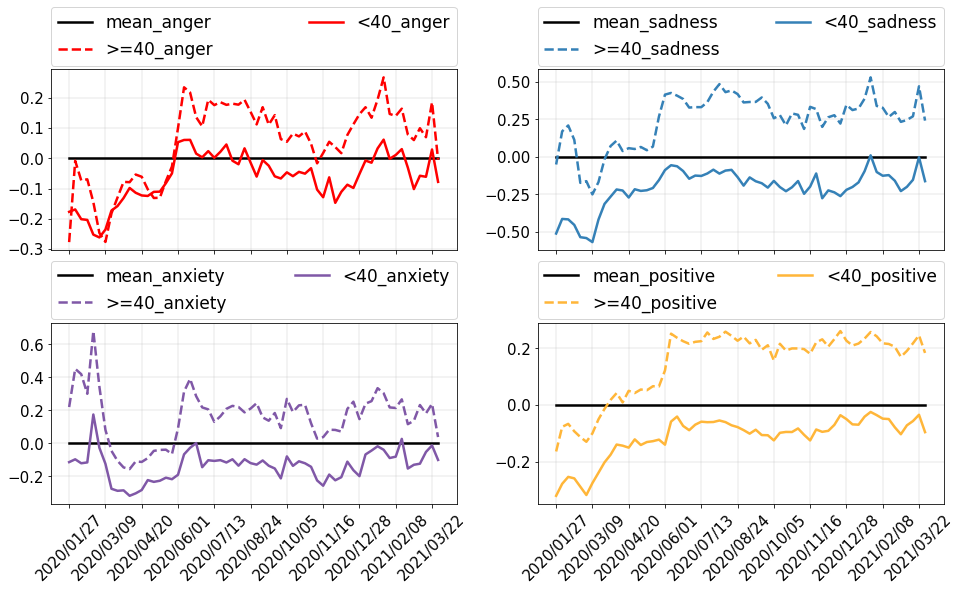

In [73]:
subplot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/es-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=[">=40", "<40"],
    categories=["Enfado", "Triste", "Ansiedad", "EmoPos"],
)

    age     size  percentage
0   <40  1148157    0.668414
1  >=40   569576    0.331586


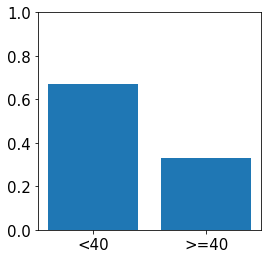

In [74]:
plot_user_percentage_per_age(
    "hydrateTweet-crunch/output/filter-inferred/per-age/en-inferred-users.csv",
    save="thesis_img/en_users_per_age",
)

### Spikes analysis

#### Week from 2020-06-15

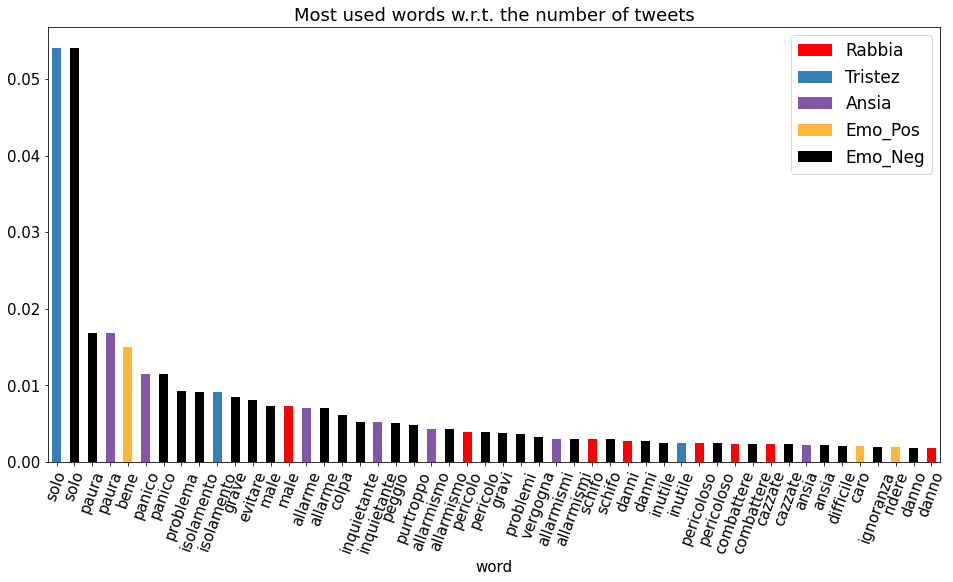

In [75]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-02-17-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    n_words=10,
)

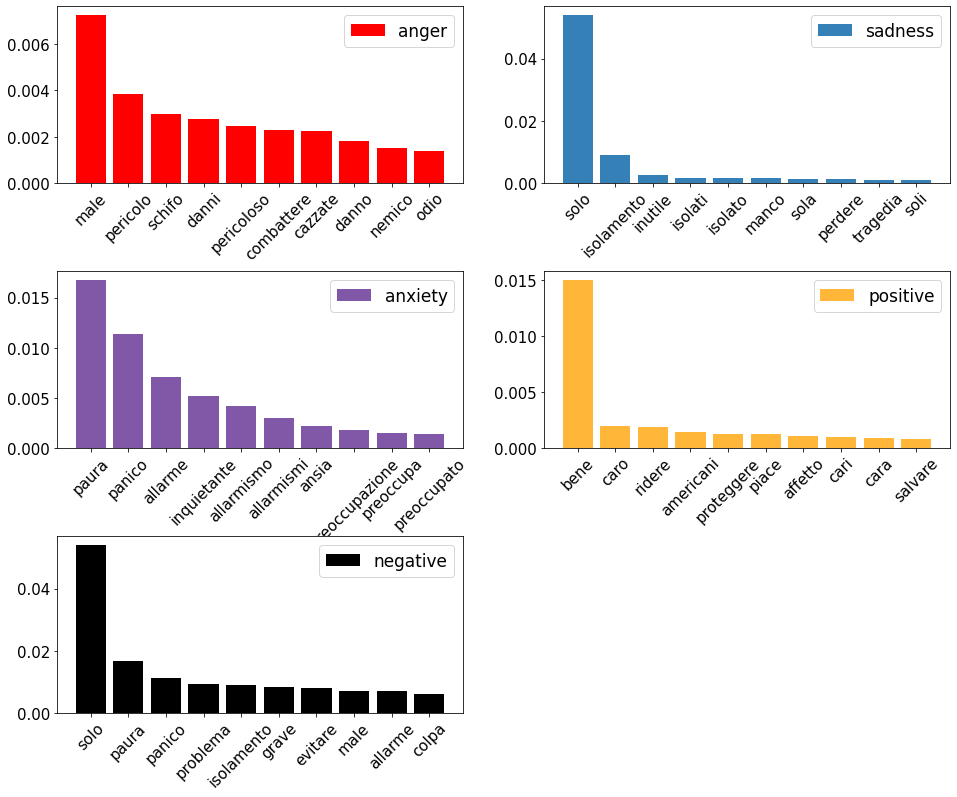

In [76]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/it-coronavirus-tweet-2020-02-17-top-30-words.csv.gz",
    categories=["Rabbia", "Tristez", "Ansia", "Emo_Pos", "Emo_Neg"],
    cols=2,
    fig_size=(16, 13),
    n_words=10,
)

### Users distribution

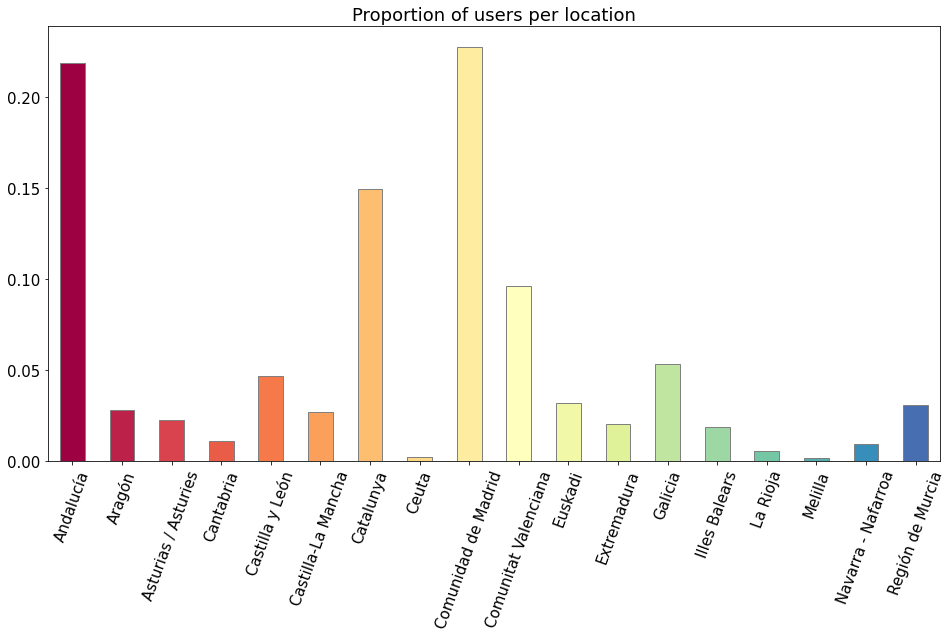

In [77]:
plot_users_distribution_per_location(
    "hydrateTweet-crunch/output/map-users-to-location/state/es-geocoded-users-per-state.json"
)

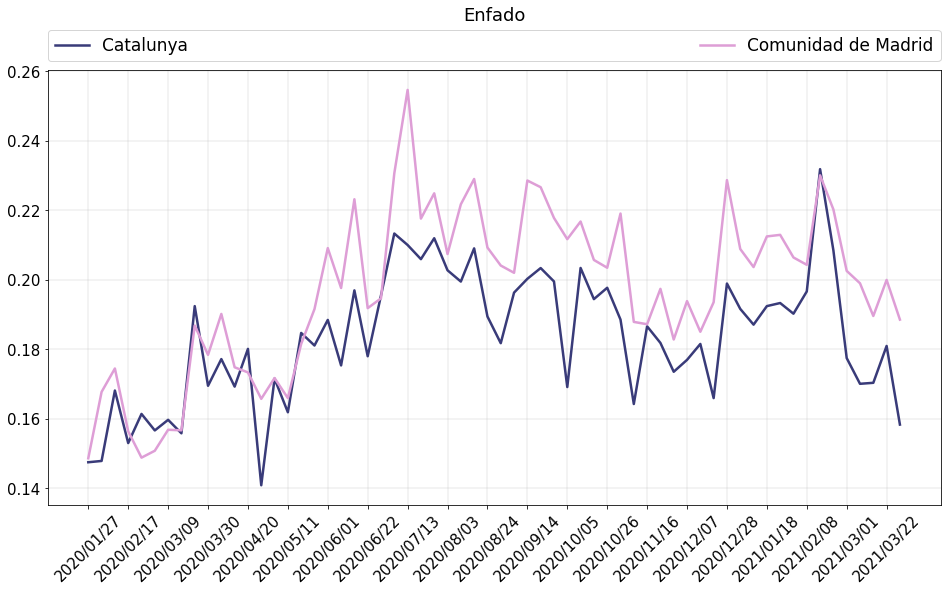

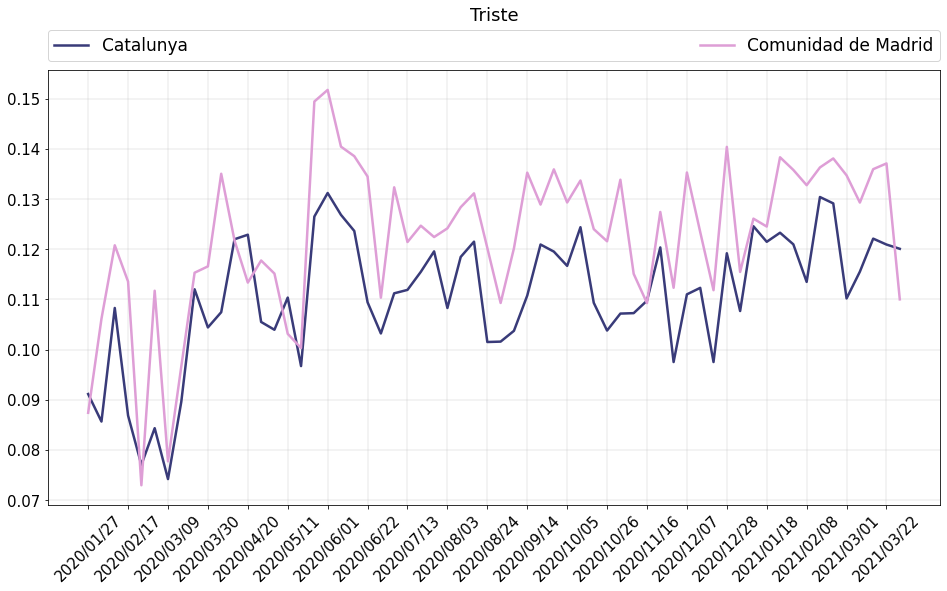

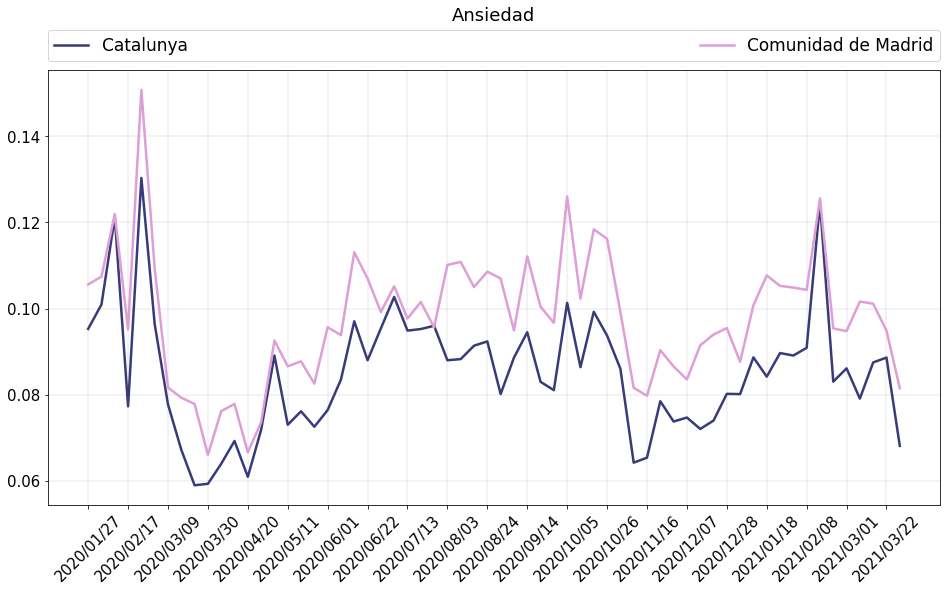

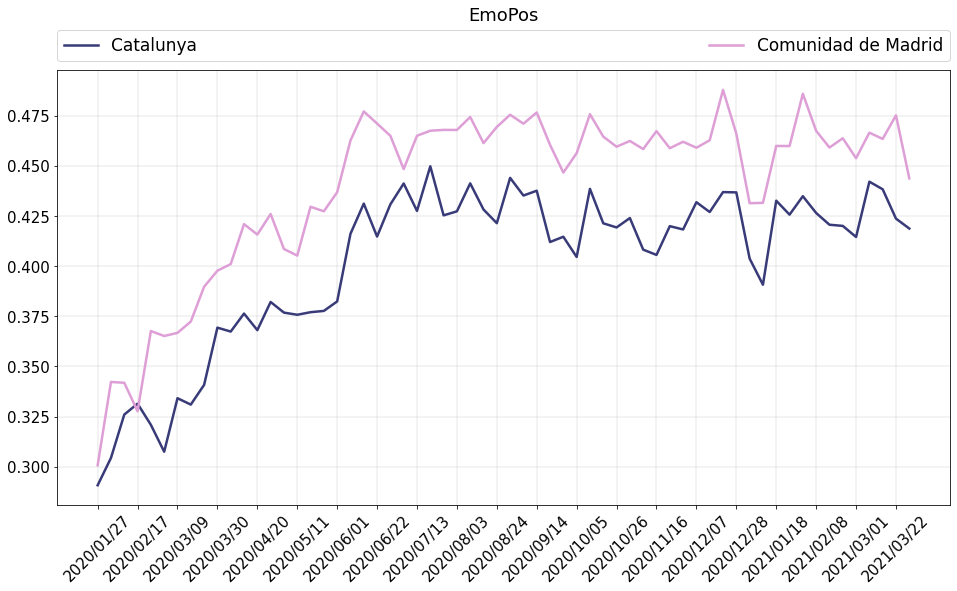

In [78]:
location_categories_files = [
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Catalunya.csv",
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Comunidad_de_Madrid.csv",
]
plot_category_per_location(
    location_categories_files, categories=["Enfado", "Triste", "Ansiedad", "EmoPos"]
)

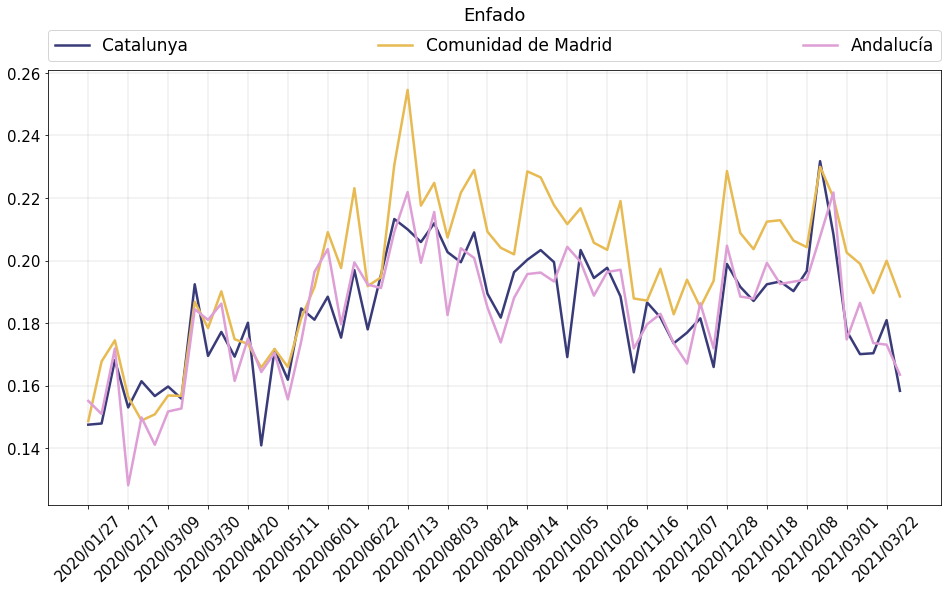

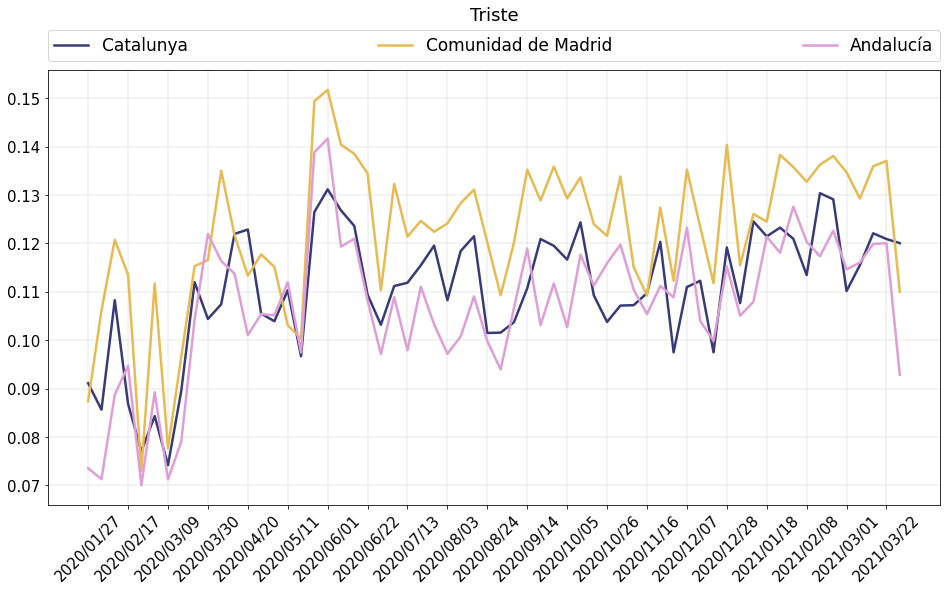

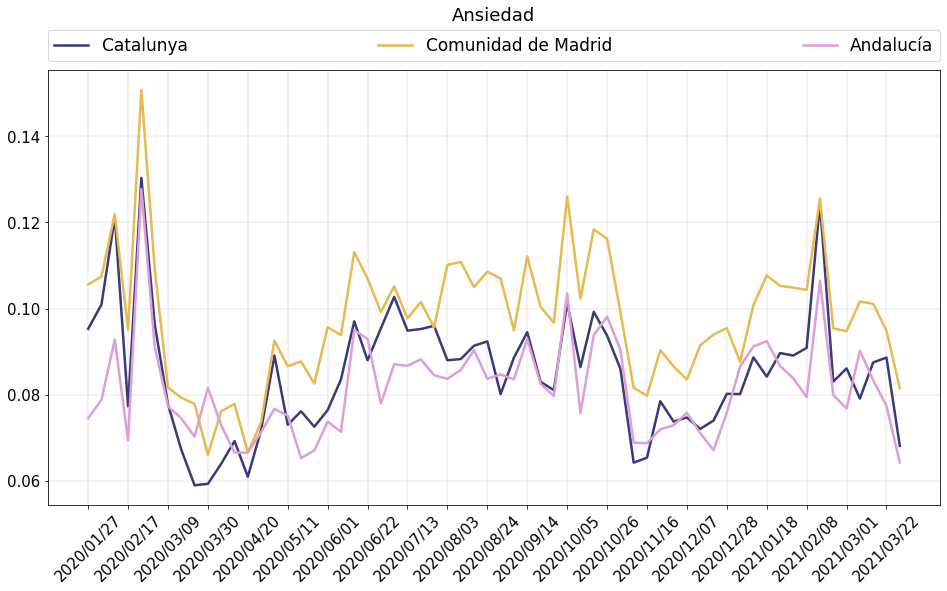

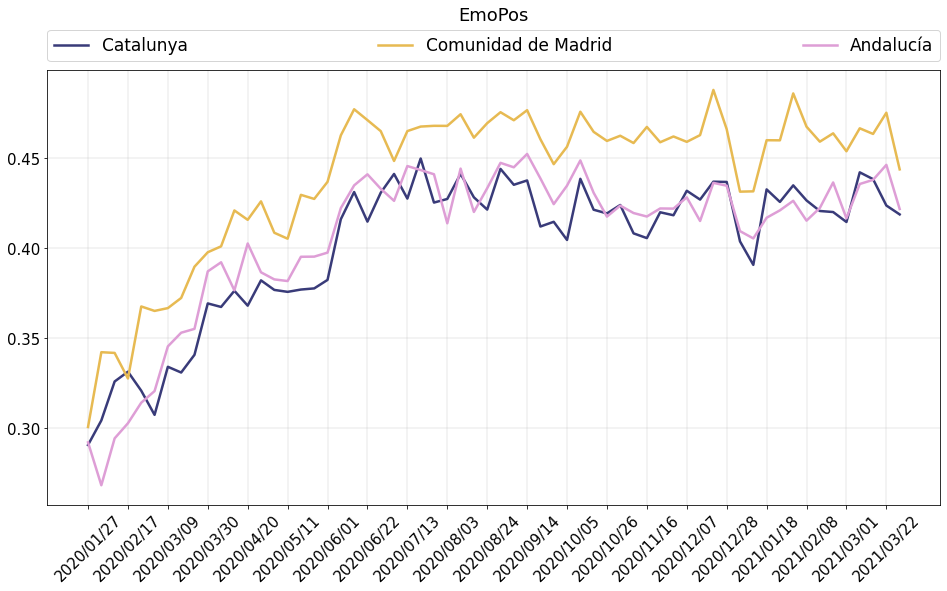

In [79]:
location_categories_files = [
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Catalunya.csv",
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Comunidad_de_Madrid.csv",
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Andalucía.csv",
]
plot_category_per_location(
    location_categories_files, categories=["Enfado", "Triste", "Ansiedad", "EmoPos"]
)

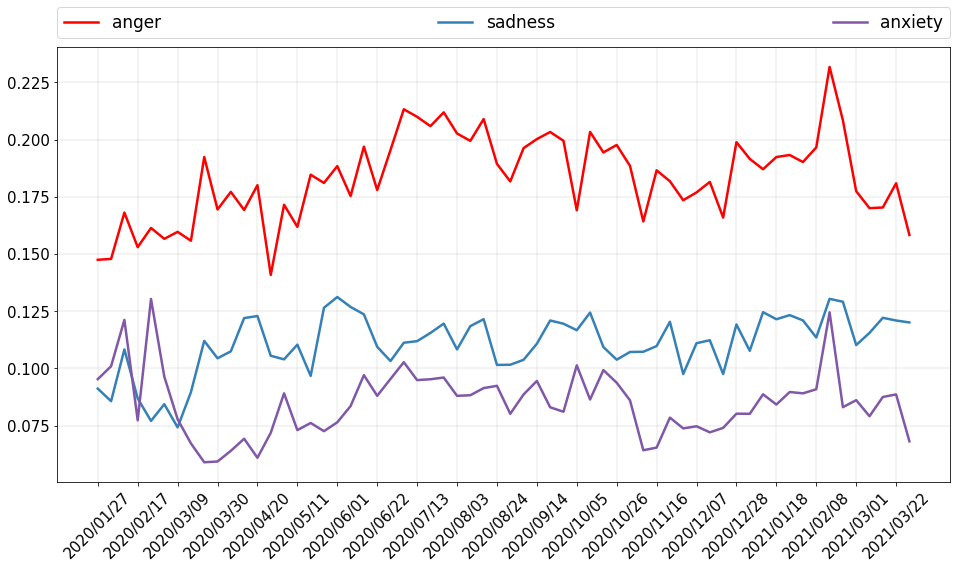

In [80]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Catalunya.csv",
    categories=["Enfado", "Triste", "Ansiedad"],
)

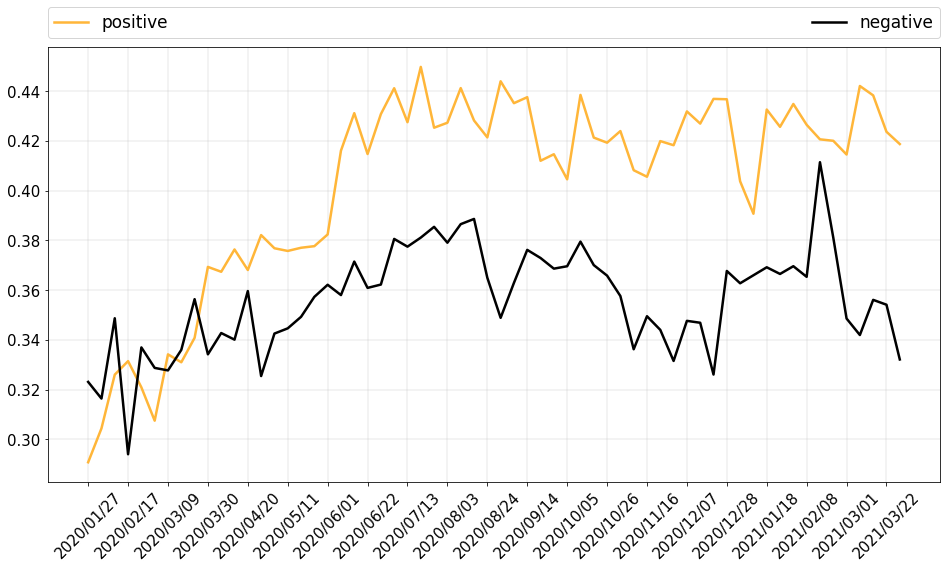

In [81]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Catalunya.csv",
    categories=["EmoPos", "EmoNeg"],
)

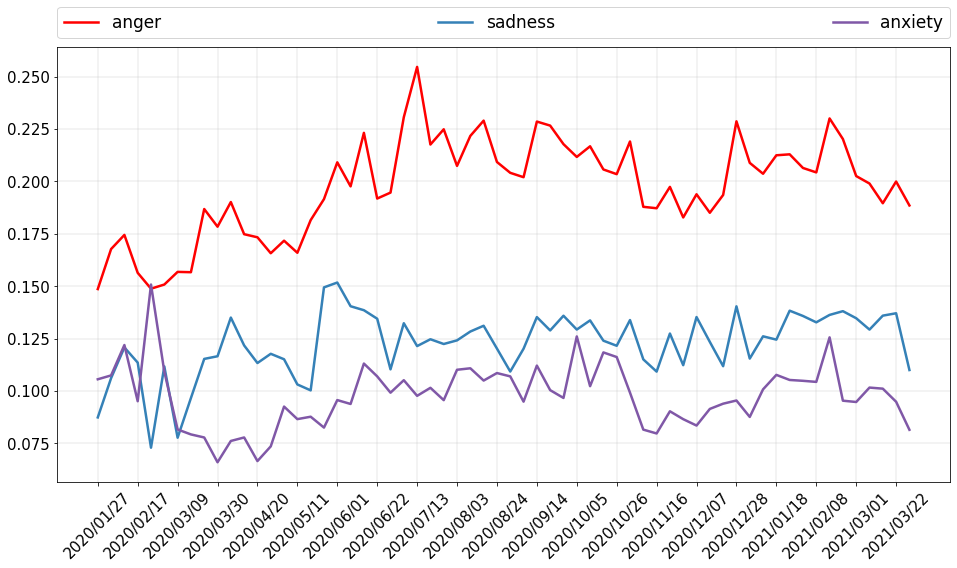

In [82]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Comunidad_de_Madrid.csv",
    categories=["Enfado", "Triste", "Ansiedad"],
)

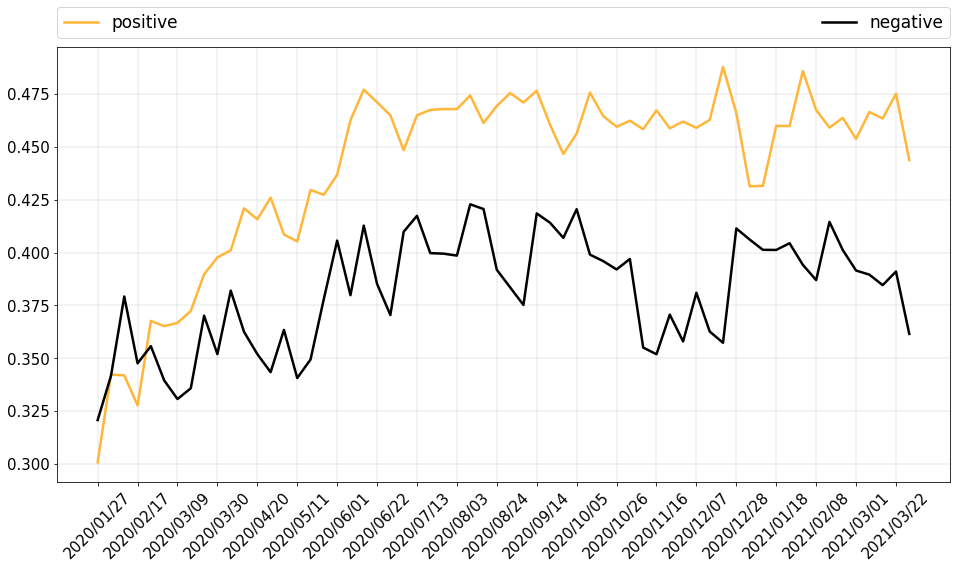

In [83]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-locations-categories/state/es/es-coronavirus-tweet-Comunidad_de_Madrid.csv",
    categories=["EmoPos", "EmoNeg"],
)

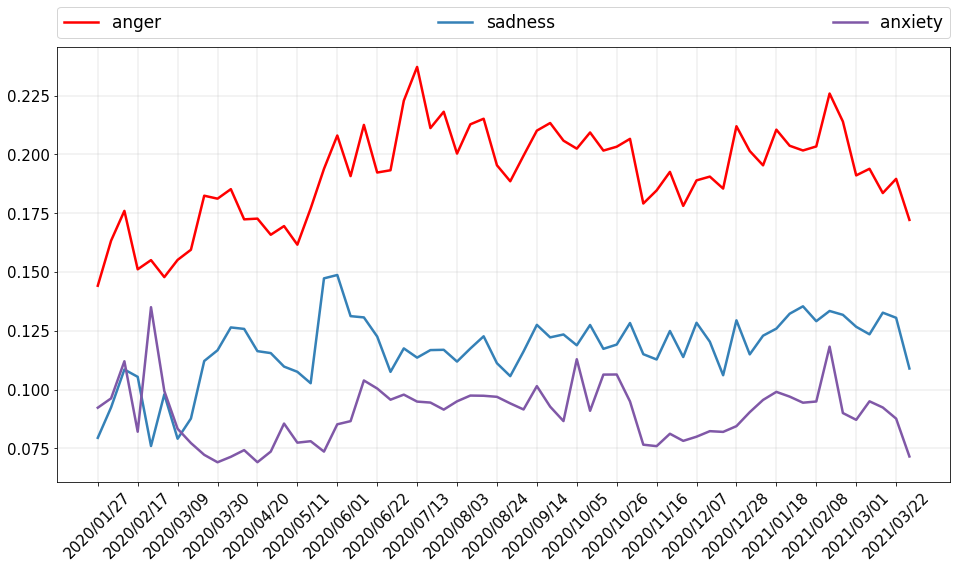

In [84]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-locations-categories/country/es/es-coronavirus-tweet-España.csv",
    categories=["Enfado", "Triste", "Ansiedad"],
)

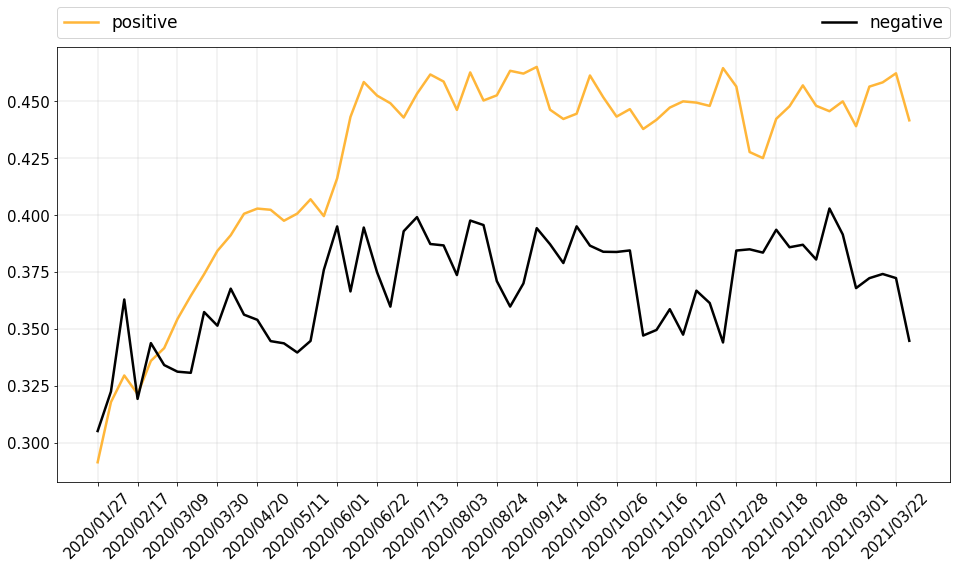

In [85]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-locations-categories/country/es/es-coronavirus-tweet-España.csv",
    categories=["EmoPos", "EmoNeg"],
)

## English tweets

### Emotions per week

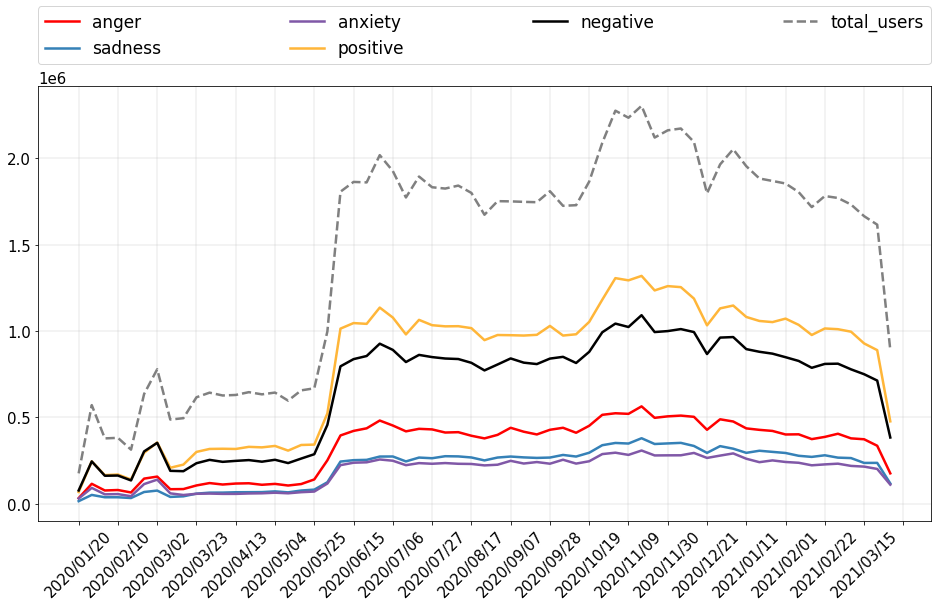

In [86]:
plot_absolute_value_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet.csv",
    save="thesis_img/en_5_liwc_categories_abs",
)

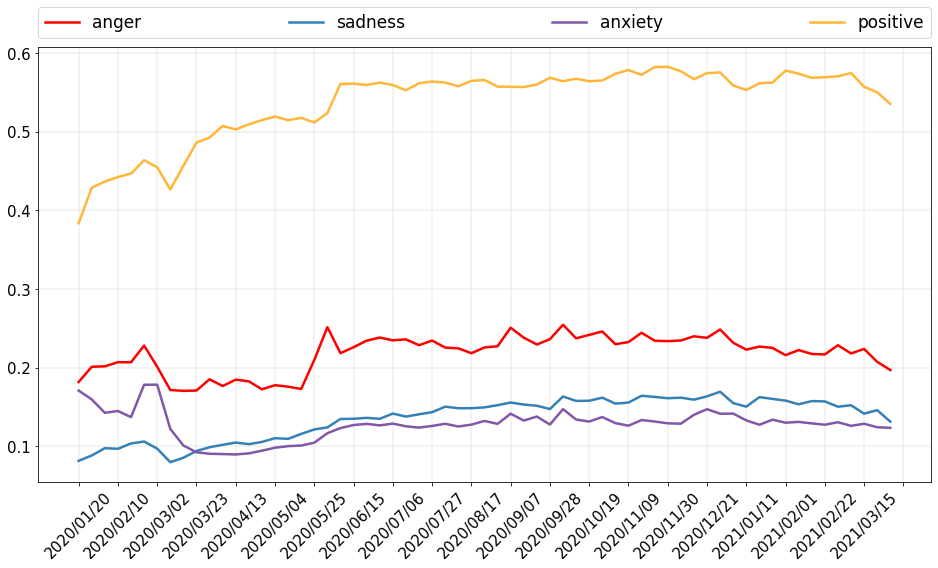

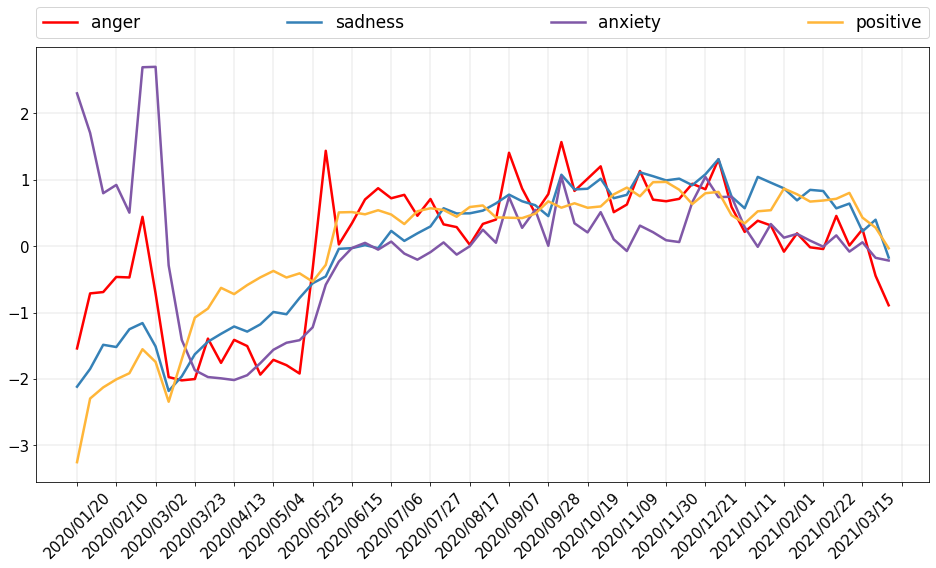

In [87]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/en-coronavirus-tweet-standardized.csv",
    save="thesis_img/en_4_liwc_categories",
    categories=["Anger", "Sad", "Anx", "Posemo"],
)

#### Emotions per week subplots

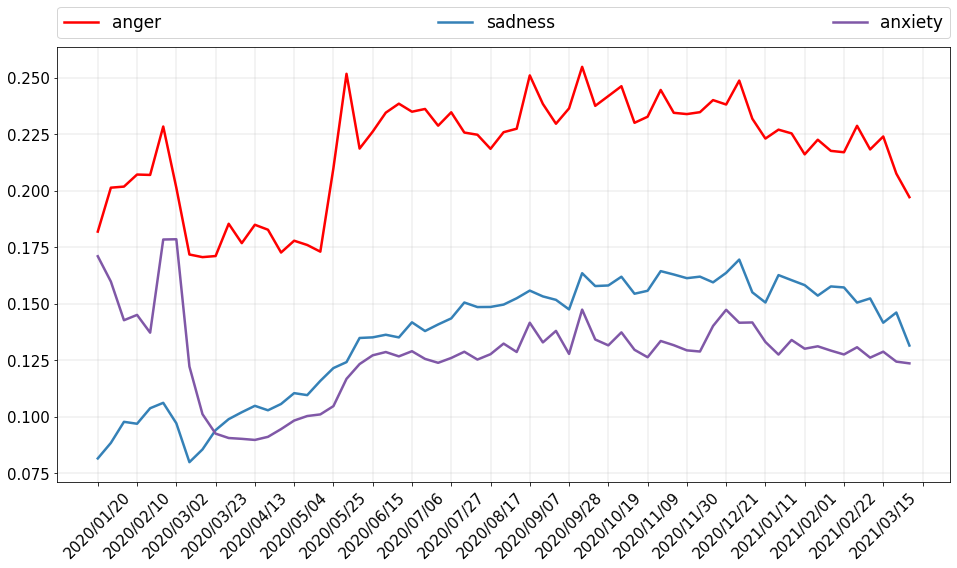

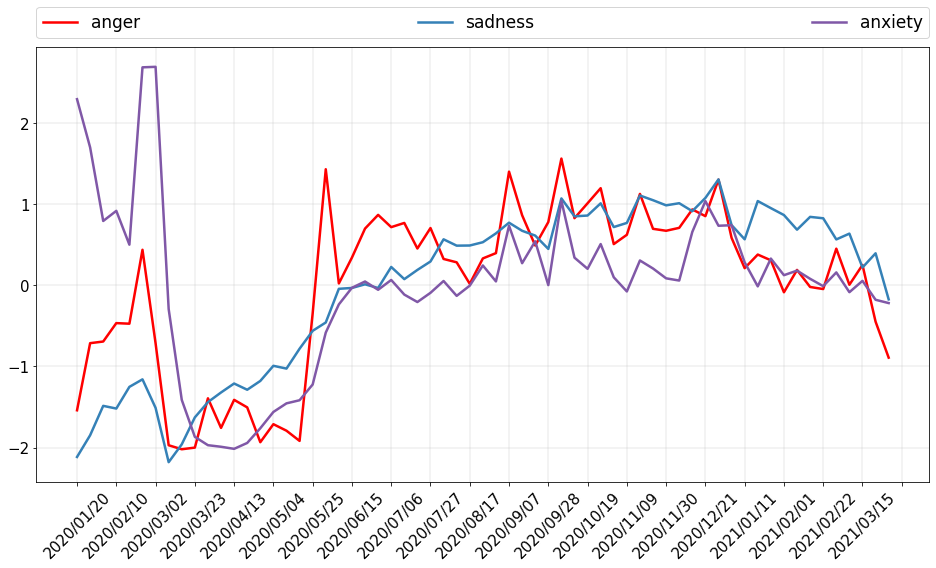

In [88]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/en-coronavirus-tweet-standardized.csv",
    categories=["Anger", "Sad", "Anx"],
)

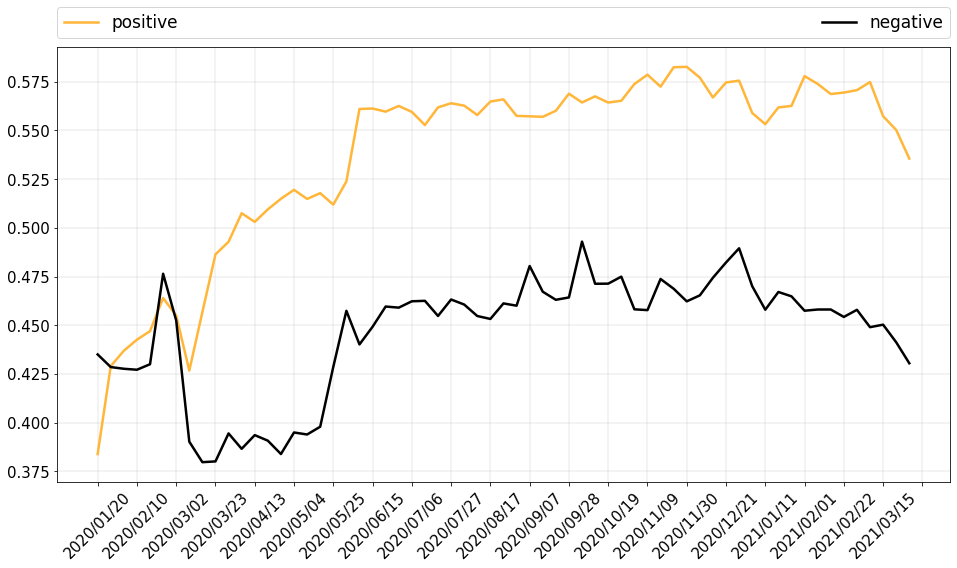

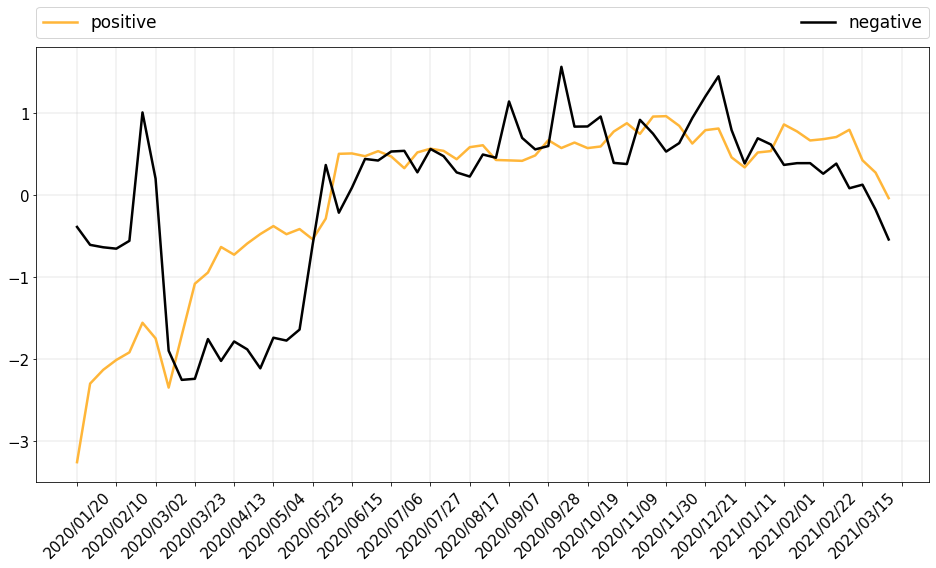

In [89]:
plot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet.csv",
    "hydrateTweet-crunch/output/liwc-standardize/en-coronavirus-tweet-standardized.csv",
    categories=["Posemo", "Negemo"],
)

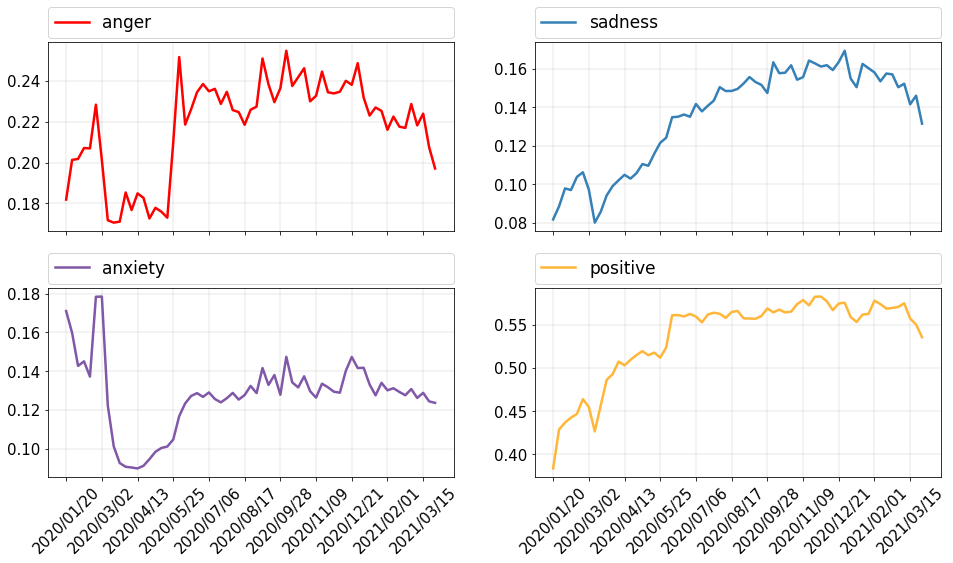

In [90]:
subplot_liwc_categories(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet.csv",
    categories=["Anger", "Sad", "Anx", "Posemo"],
    save="thesis_img/en_4_liwc_categories_subplots",
)

#### Comparison between categories and emotions

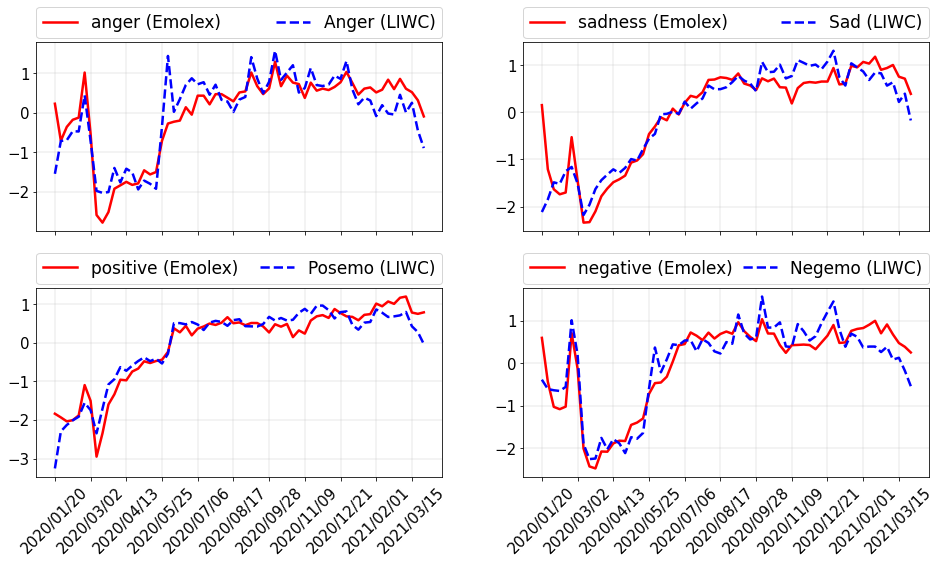

In [91]:
compare_emotion_and_liwc_categories(
    "hydrateTweet-crunch/results/standardize/en-coronavirus-tweet-standardized.csv",
    "hydrateTweet-crunch/output/liwc-standardize/en-coronavirus-tweet-standardized.csv",
    fig_size=(16, 8),
    emotions=["anger", "sadness", "positive", "negative"],
    categories=["Anger", "Sad", "Posemo", "Negemo"],
    save="thesis_img/en_emotions_and_liwc_categories_comparison",
)

### Emotions per category per week

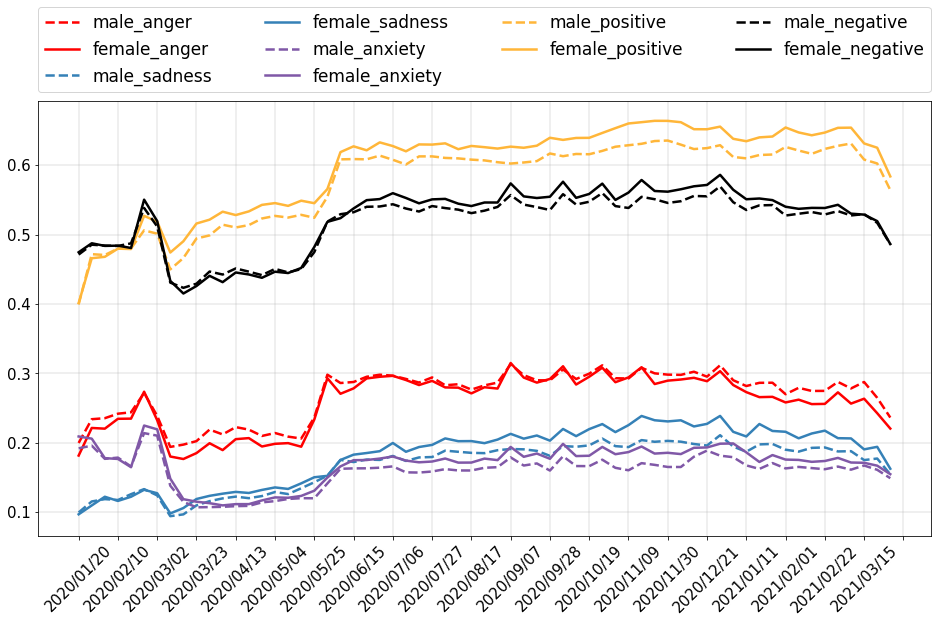

In [92]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-category.csv",
    kinds=["male", "female"],
)

#### Emotions per category per week subplots

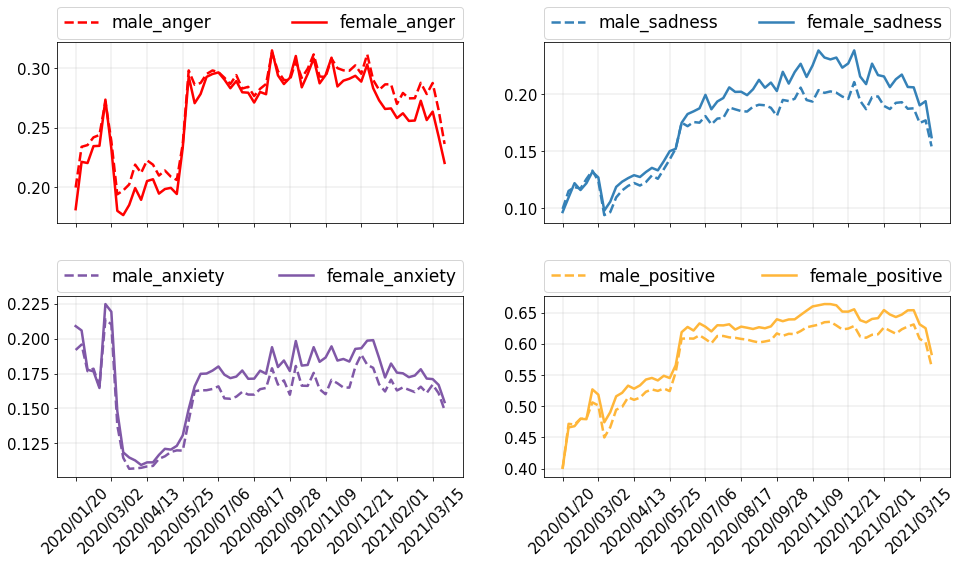

In [93]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-category.csv",
    cols=2,
    kinds=["male", "female"],
)

#### Emotions per category per week subplots (w.r.t. emotions expressed by all the users)

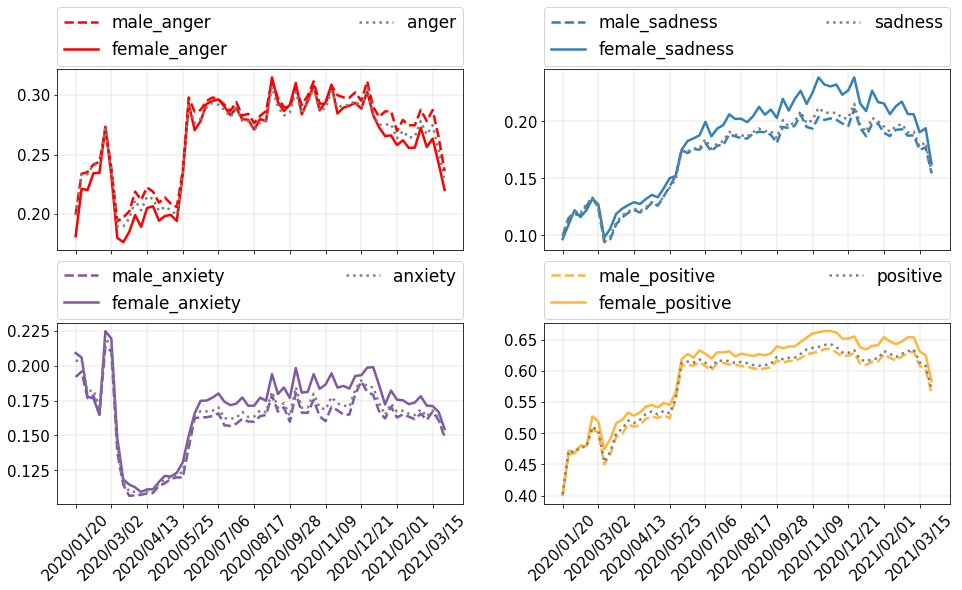

In [94]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=["male", "female"],
    save="thesis_img/en_4_categories_per_gender_with_course_subplot",
)

#### Z-score per category per week

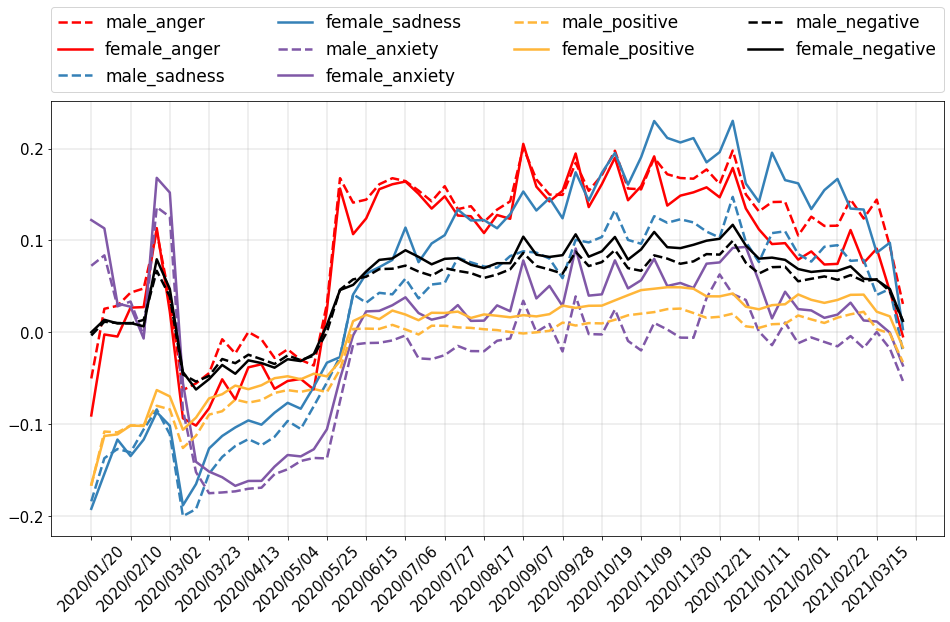

In [95]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/liwc-standardize/en-coronavirus-tweet-per-category-standardized.csv",
    kinds=["male", "female"],
)

### Emotions per tweet filtered by users number of tweets

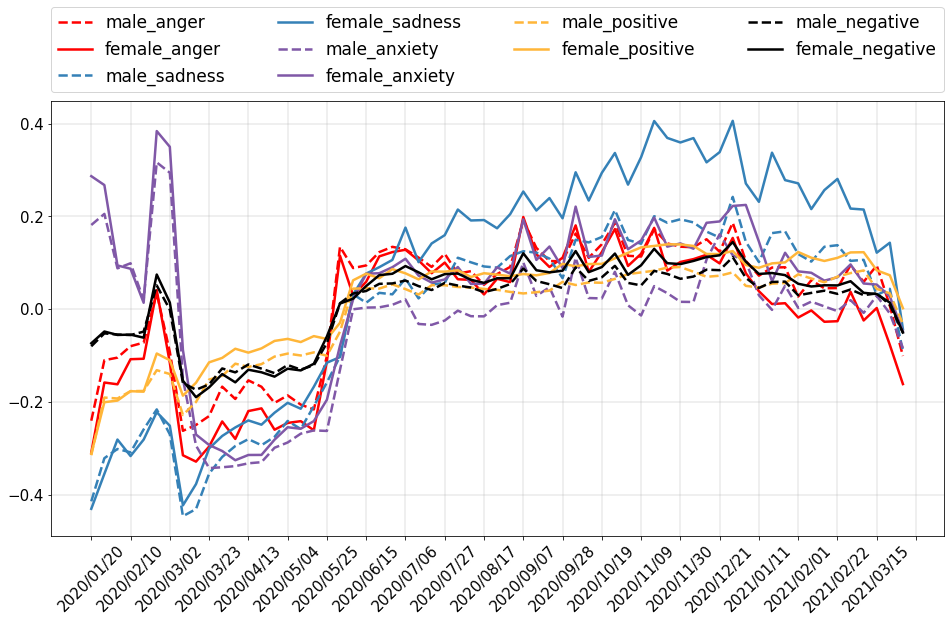

In [96]:
plot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-filtered.csv",
    kinds=["male", "female"],
)

#### Emotions per category per week w.r.t. mean emotion value

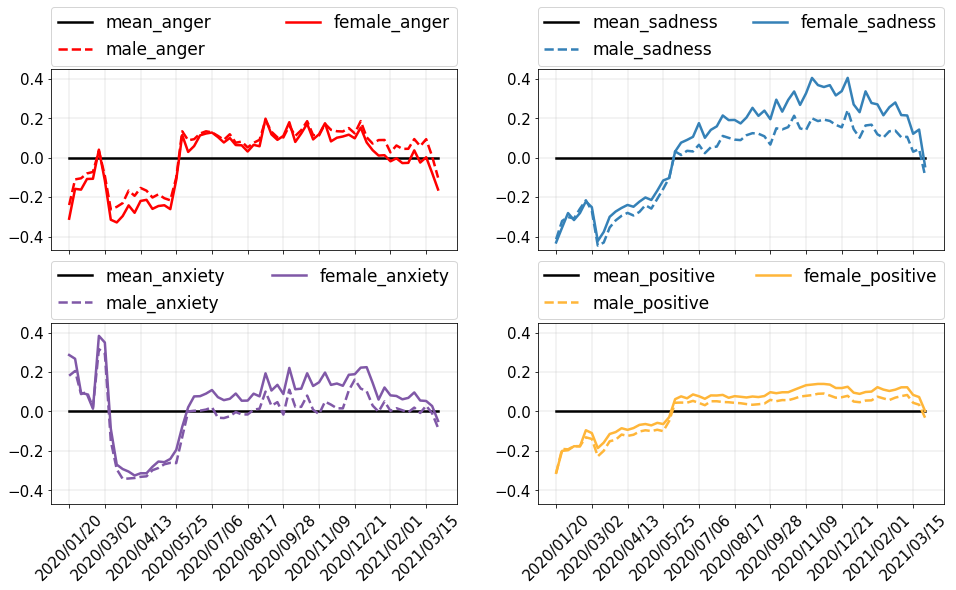

In [97]:
subplot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-category.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=["male", "female"],
    save="thesis_img/en_4_categories_per_gender_over_mean_subplot",
    ylim=(-0.47, 0.45),
)

### Emotions per age per week

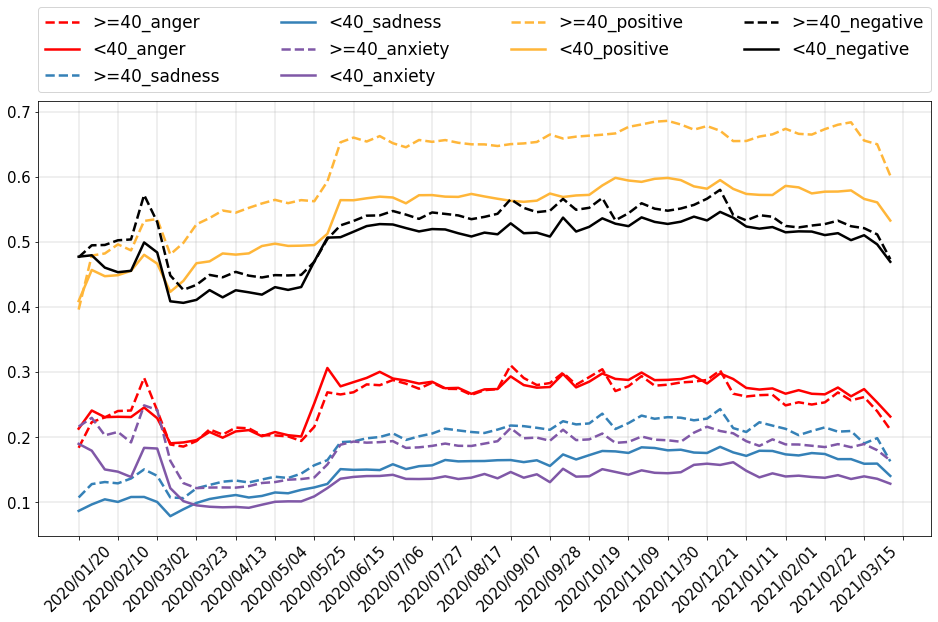

In [98]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-age.csv",
    kinds=[">=40", "<40"],
)

#### Emotions per age per week subplots

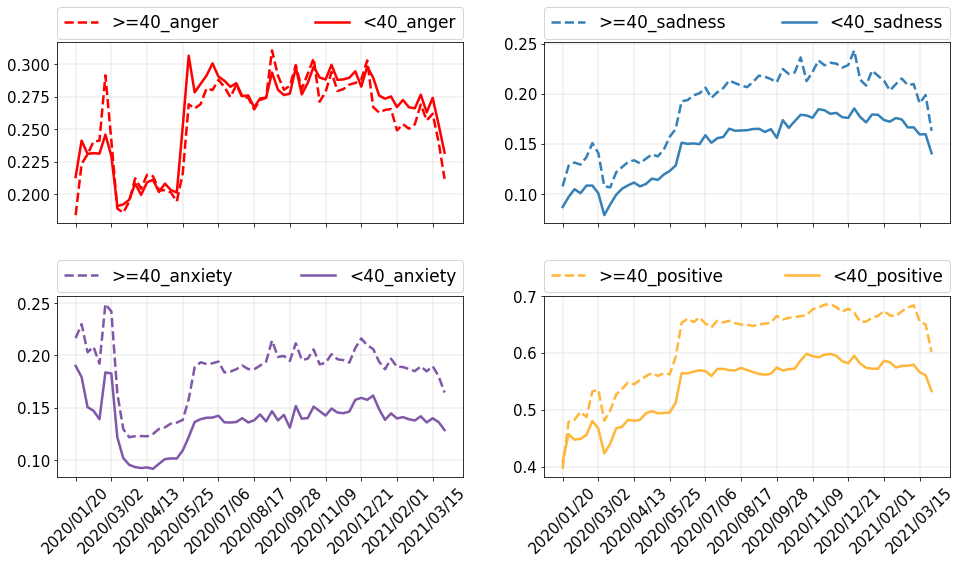

In [99]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-age.csv",
    cols=2,
    kinds=[">=40", "<40"],
)

#### Emotions per age per week subplots (w.r.t. emotions expressed by all the users)

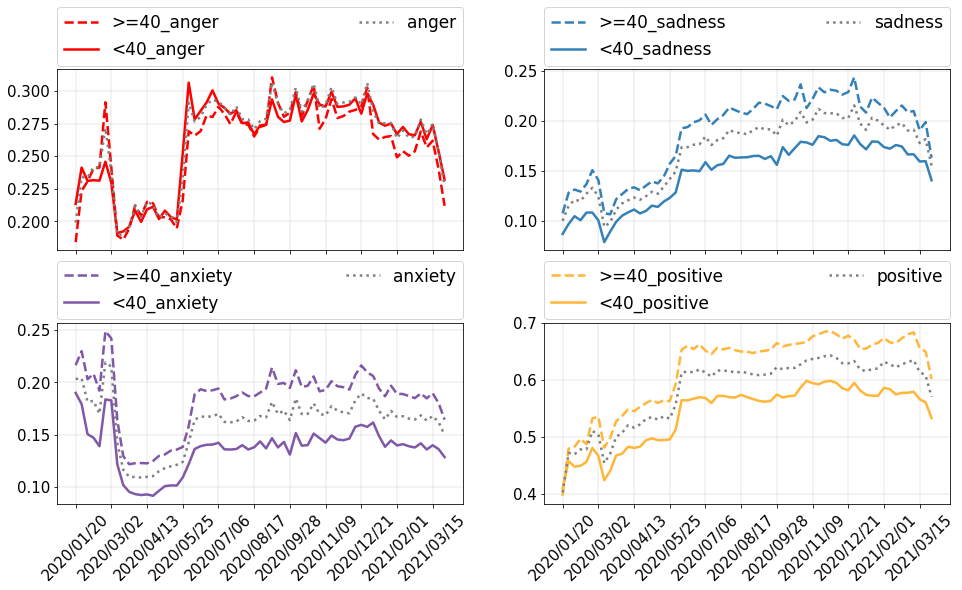

In [100]:
subplot_categories_per_kind(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=[">=40", "<40"],
    save="thesis_img/en_4_categories_per_age_with_course_subplot",
)

#### Z-score per age per week

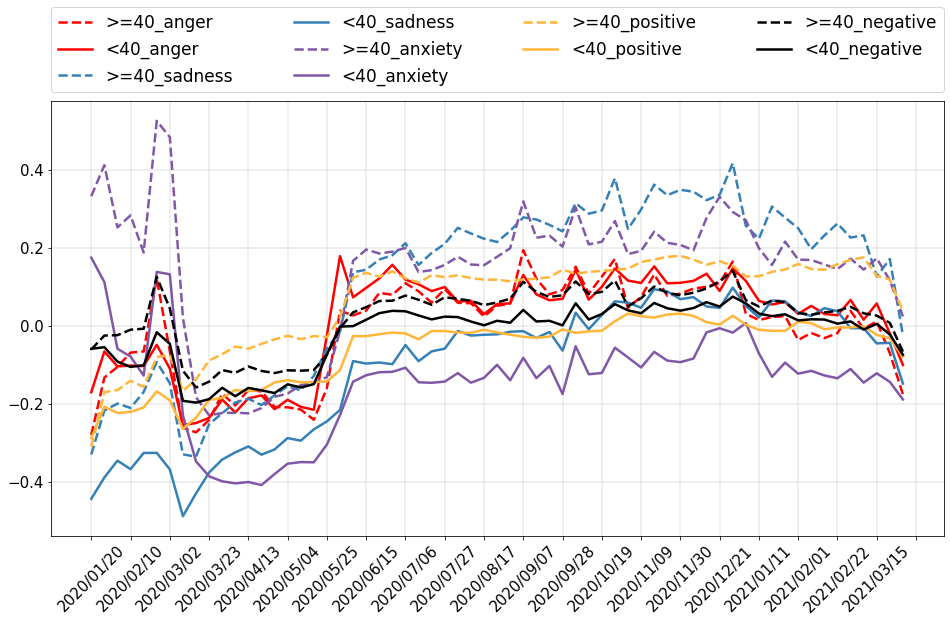

In [101]:
plot_categories_per_kind(
    "hydrateTweet-crunch/output/liwc-standardize/en-coronavirus-tweet-per-age-standardized.csv",
    kinds=[">=40", "<40"],
)

### Emotions per tweet filtered by users number of tweets

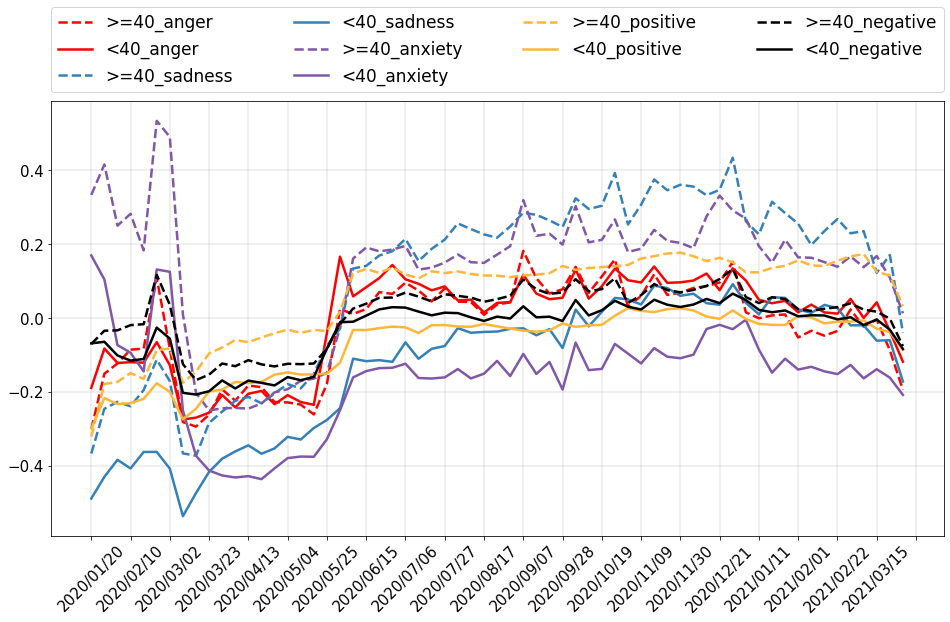

In [102]:
plot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-filtered.csv",
    kinds=[">=40", "<40"],
)

#### Emotions per age per week w.r.t. mean emotion value

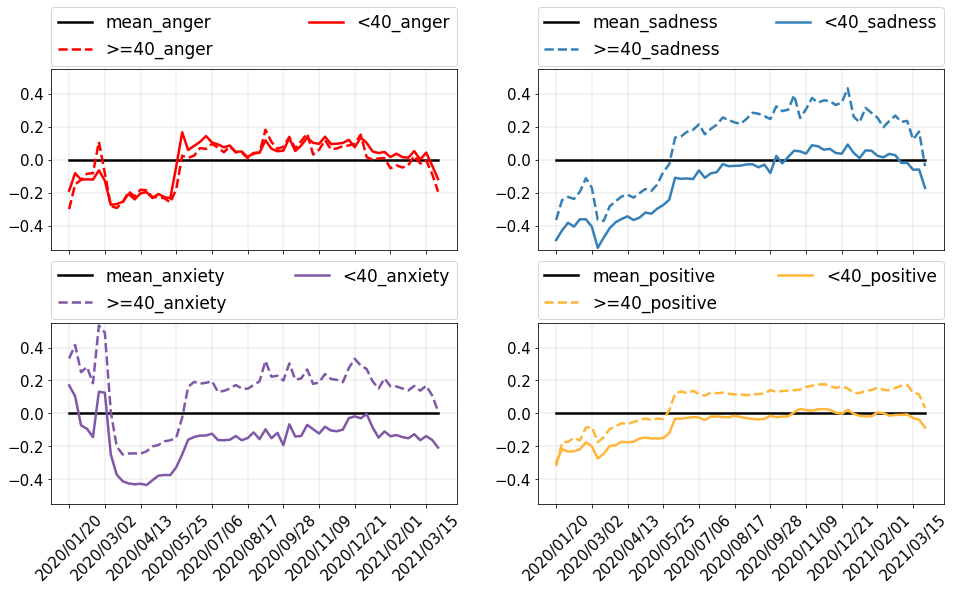

In [103]:
subplot_categories_per_kind_wrt_total(
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-per-age.csv",
    "hydrateTweet-crunch/output/analyse-liwc-categories/en-coronavirus-tweet-filtered.csv",
    cols=2,
    kinds=[">=40", "<40"],
    save="thesis_img/en_4_categories_per_age_over_mean_subplot",
    ylim=(-0.55, 0.55),
)

    age     size  percentage
0   <40  1148157    0.668414
1  >=40   569576    0.331586


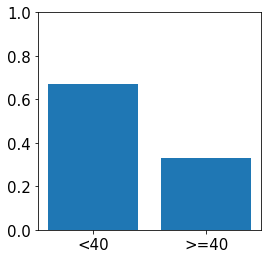

In [104]:
plot_user_percentage_per_age(
    "hydrateTweet-crunch/output/filter-inferred/per-age/en-inferred-users.csv",
    save="thesis_img/en_users_per_age",
)

### Spikes analysis

#### Week from 2020-02-24

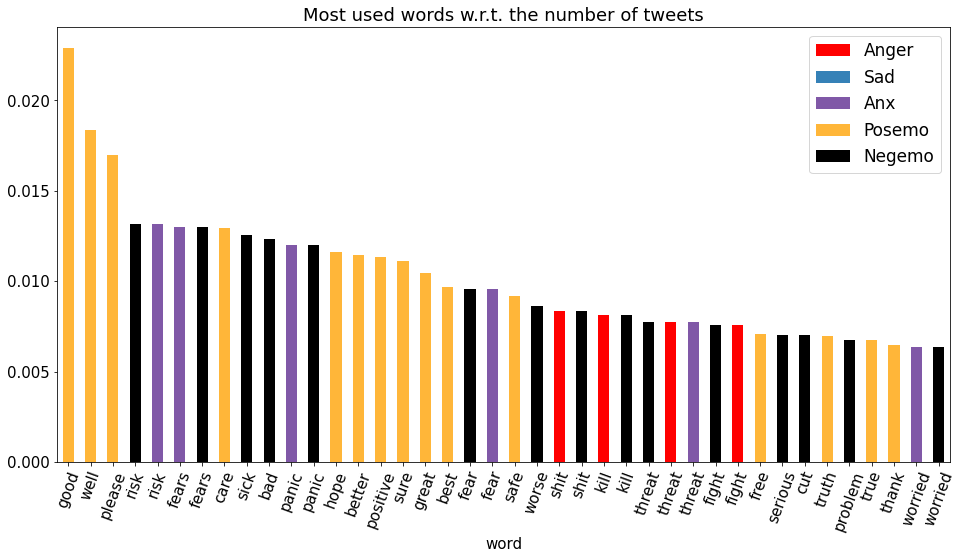

In [105]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/en-coronavirus-tweet-2020-02-24-top-30-words.csv.gz",
    n_words=8,
    save="thesis_img/en_most_used_liwc_words_2020_02_24",
)

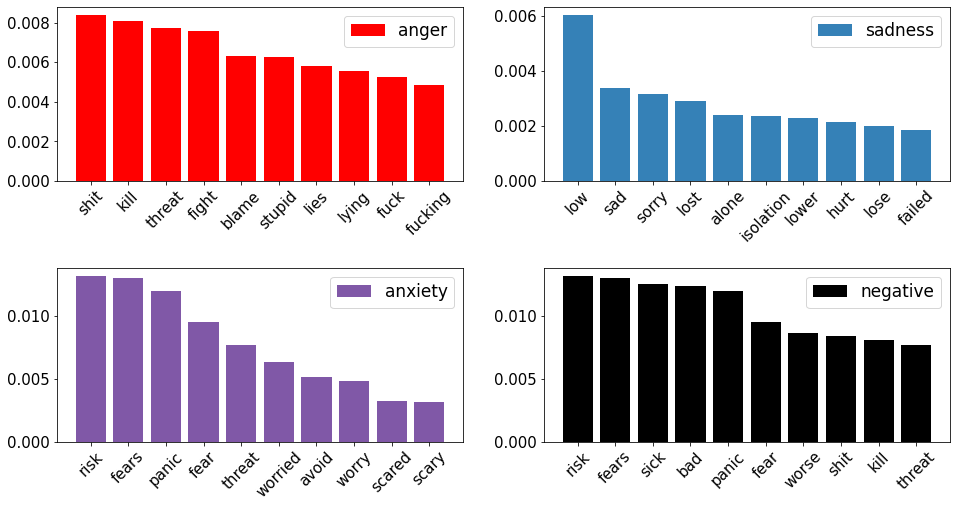

In [106]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/en-coronavirus-tweet-2020-02-24-top-30-words.csv.gz",
    categories=["Anger", "Sad", "Anx", "Negemo"],
    cols=2,
    fig_size=(16, 8),
    n_words=10,
)

#### Week from 2020-03-09

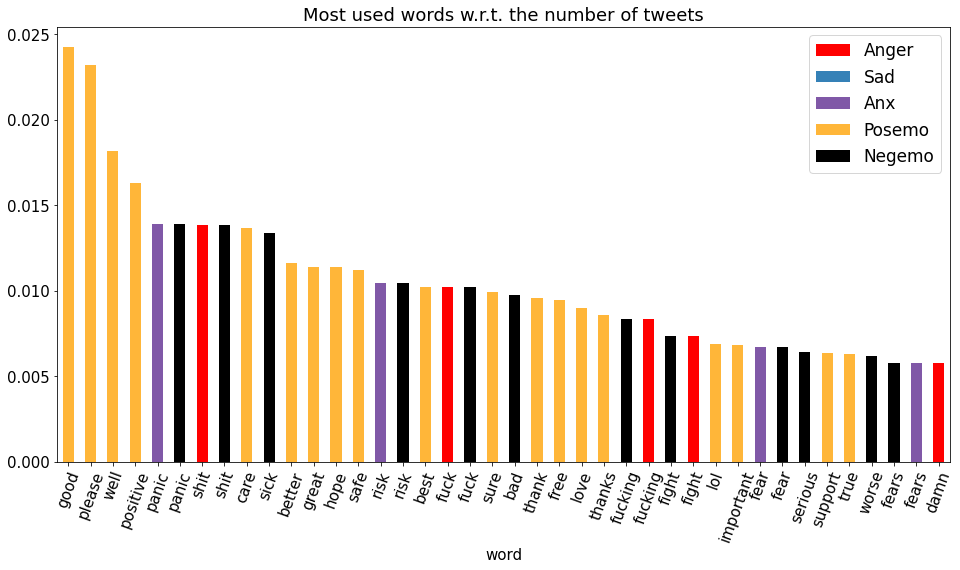

In [107]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/en-coronavirus-tweet-2020-03-09-top-30-words.csv.gz",
    n_words=8,
)

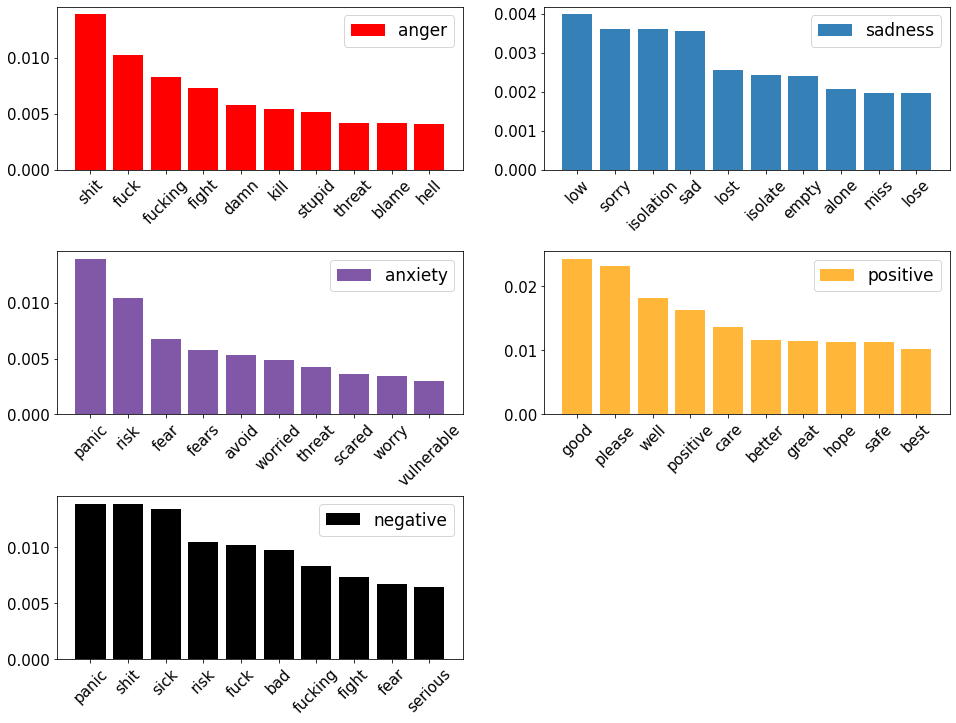

In [108]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/en-coronavirus-tweet-2020-03-09-top-30-words.csv.gz",
    cols=2,
    fig_size=(16, 12),
    n_words=10,
)

#### Week from 2020-06-01

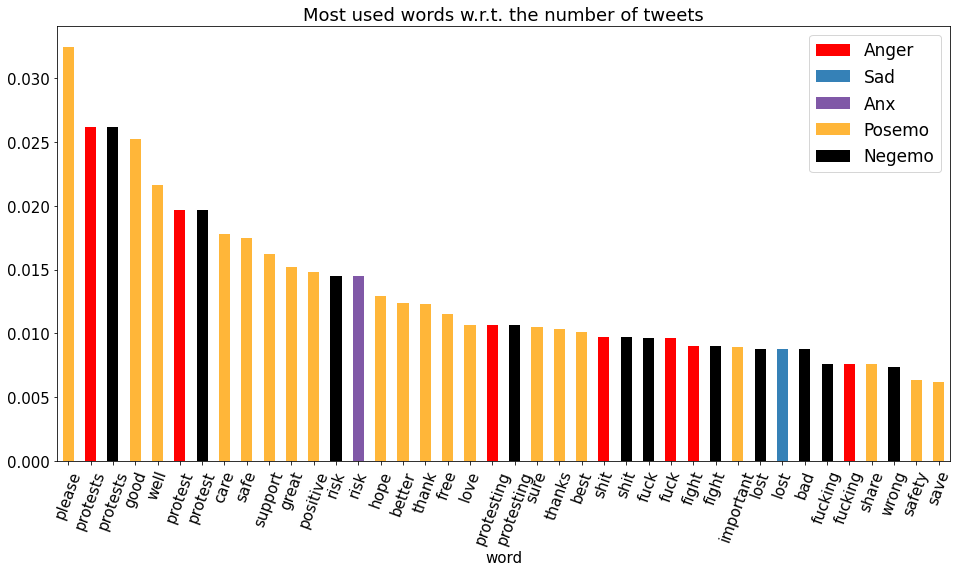

In [109]:
plot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/en-coronavirus-tweet-2020-06-01-top-30-words.csv.gz",
    n_words=8,
)

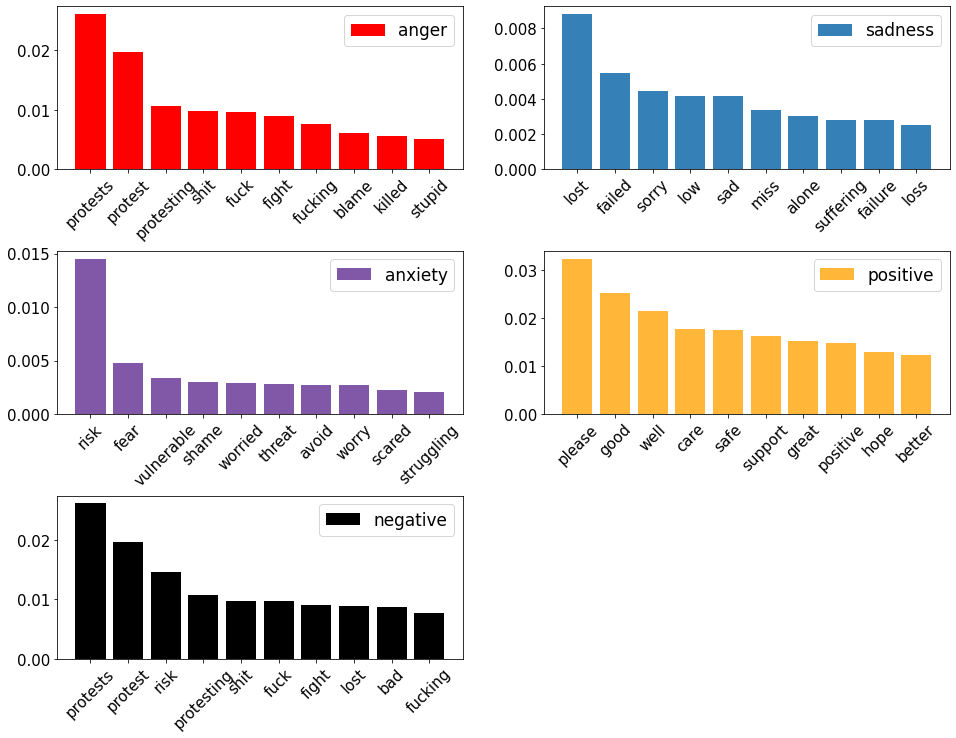

In [110]:
subplot_words_frequency_per_category(
    "hydrateTweet-crunch/output/liwc-words-frequency/en-coronavirus-tweet-2020-06-01-top-30-words.csv.gz",
    cols=2,
    fig_size=(16, 12),
    n_words=10,
)